# Introducción

El libro de Leland Wilkinson *The Grammar of Graphics* (1999) es un clásico entre los libros de visualización de datos. En él, Wilkinson propone un framework que unifica el diseño, implementación e interpretación de un gráfico. La *Gramática de los gráficos* se ha hecho especialmente famosa tras su implementación en el paquete de R [ggplot2](http://ggplot2.org/). También existe una versión de este paquete para [Python](http://ggplot.yhathq.com/) que, lamentablemente, es bastante limitada en comparación con la de R. Dado que las sintaxis de *ggplot* son muy similares en ambos lenguajes, en este notebook emplearemos R (de una forma muy transparente, por lo que no hace falta experiencia con este lenguaje). En el apéndice puedes encontrar instrucciones acerca de como usar Jupyter con R.

En esta sesión exploraremos algunos de los conceptos principales que subyacen a esta *Gramática de los gráficos*. Pero, ¿Qué es una *gramática de gráficos*?

Una *Gramática de los gráficos* es una herramienta que permite describir de forma concisa los componenentes de una gráfica. Dicha gramática nos proporciona la posibilidad de superar los gráficos prefabricados (como los que encontramos en Excel) y profundizar en la estructura que subyace a todos los gráficos estadísticos. En la "aproximación Excel" elegimos una tipo de gráfico entre una lista de posibilidades predefinas para representar nuestros datos: ¿Desea usted un *gráfico de barras*, un *gráfico circular* o un *gráfico de líneas*? Lo cierto es que esta forma de construir gráficas no incita a la reflexión. Por otra parte, para comprender la *gramática de los gráficos* tenemos que reflexionar como se construyen las gráficas.


# Introducción a **ggplot** ¿Cómo construir un gráfico?

Hay dos principios fundamentales a tener en cuenta a la hora de intentar construir un gráfico siguiendo la metodología de la *gramática de los gráficos*:

* Gráficos = distintas capas formadas por elementos gramaticales (elemento gramatical = pieza mínima para la construcción de gráficas).
* Los gráficos más utiles se optienen mediante un buen *mapeado estético*

Hay 7 elementos gramaticales en **ggplot**, de los cuáles sólo los tres primeros son imprescindibles:
* Los datos: en el caso de **ggplot**, en formato *data.frame* (o *pandas.DataFrame* en python) .
* Elementos estéticos: los atributos visuales en los que mapearemos los datos.
* Geometrías: Los elementos visuales que emplearemos para representar los datos.
* Facets: Forma de representación que nos permitirá representar subconjuntos de datos.
* Estadísticos: Representaciones estadísticas de los datos.
* Coordenadas: El sistema de coordenadas empleado para la representación de los datos (cartesiano  o polar).
* Anotaciones y temas: Todas las representaciones sin relación directa con los datos (el fondo del gráfico o su título, por ejemplo).

Estos elementos gramaticales se combinan en forma de capas para construir un gráfico. De esta forma, el proceso de construcción de un gráfico básico en **ggplot** se puede resumir como sigue:

* **Mapeamos** cada una de las variables que deseamos representar a algún atributo estético (*aesthetic*, más sobre esto más adelante). Por ejemplo, para hacer un *scatterplot* de A frente a B mapeamos A al atributo "posición en el eje x" y B al atributo "posición en el eje y".  Este proceso puede representarse mediante la creación de otro *data.frame*:
<img src="ggmapping.png" style="width: 800px;"/>


* Mediante el mapeado que hemos hecho podemos generar gráficos distintos dependiento del tipo de **geometría** que empleamos para representar los atributos estéticos. Por ejemplo, si dibujamos puntos obtendremos un *scatterplot*, si usamos líneas una *gráfica de líneas* y si usamos barras, un *gráfico de barras*.
* Para crear el gráfico final tenemos que combinar objetos gráficos procedentes de tres fuentes: nuestros datos (cons sus atributos estéticos y geometrías asociadas); las escalas(¿usamos escala logarítmica o no?) y el **sistema de coordenadas** (¿usamos una representación cartesiana o polar?; y las **anotaciones y temas** (como el fondo del gráfico o el título del gráfico). Estos elementos y su combinación para formar el gráfico final pueden verse en la figura siguiente.

<img src="grammatic_elements.png" style="width: 800px;"/>


Esta explicación es posiblemente difícil de digerir... veamos un ejemplo con **ggplot** para intentar aclarar ideas. 
Para ilustrar la esencia de construir un gráfico vamos a emplear el dataset [diamonds](http://www.rdocumentation.org/packages/ggplot2/functions/diamonds) incluído en el paquete **ggplot**. Antes de nada cargamos la librería y hacemos los gráficos un poco más pequeños.



In [1]:
library('ggplot2')
options(repr.plot.width=6, repr.plot.height=4)

Intentemos crear un  *scatterplot* del precio del diamante (*price*) Vs. los quilates (*carat*). Para ello, el primer paso sería crear el mapeado de nuestros **datos** (contenidos en el data.frame *diamonds*) a los atributos estéticos deseados (*prices* al atributo "posición en el eje y" y *carat* al atributo "posición en el eje x"). En **ggplot** esto se indicaría de la siguiente forma: 

In [2]:
# aes es una función que especifica los "aesthetics" del gráfico
p = ggplot(diamonds, aes(x = carat, y = price)) 

No te preocupes si no aparece ningún gráfico. Hasta el momento, solo hemos construído la primera capa de nuestra gráfica, pero todavía no hemos renderizado nada. Fíjate que es posible almacenar los pasos intermedios en una variable. La siguiente capa que consideraremos será la de **geometrías**. Esta es la última capa necesaria para crear un gráfico (vease la explicación anterior) ya que **ggplot** completará nuestra especificación mediante capas por defecto para completar el *plot*. La geometría adecuada para realizar un *scatterplot* es *geom_point*:

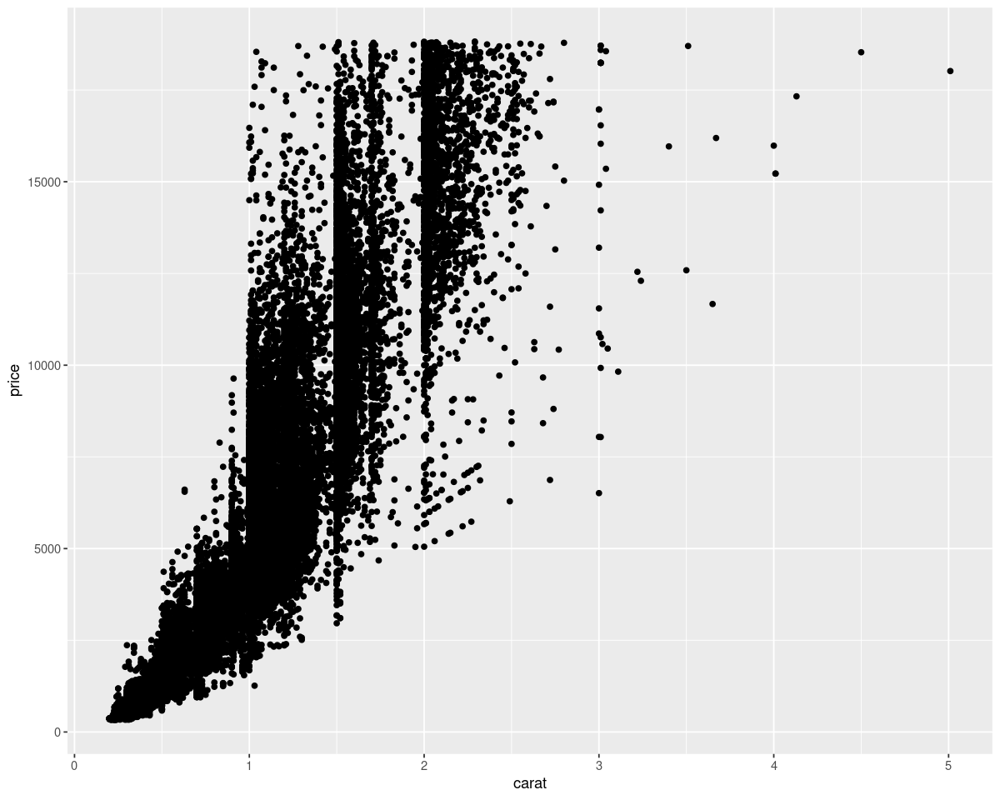

In [3]:
# Establece el tamaño deseado para la gráfica
options(
  repr.plot.width = 10,  # Ancho en pulgadas
  repr.plot.height = 8  # Alto en pulgadas
)

p = p + geom_point()
# para visualizar el gráfico. Debemos imprimirlo mediante print o simplemente teclear su nombre en la terminal
p
# También podríamos haber escrito
# ggplot(diamonds, aes(x = 'carat', y = 'price')) + geom_point()

Usando 
```R
ggplot(diamonds, aes(x = 'carat', y = 'price')) + geom_point()
```
solo aparece un punto por lo que hay que usar

```R
ggplot(diamonds, aes(x = carat, y = price)) + geom_point()
```

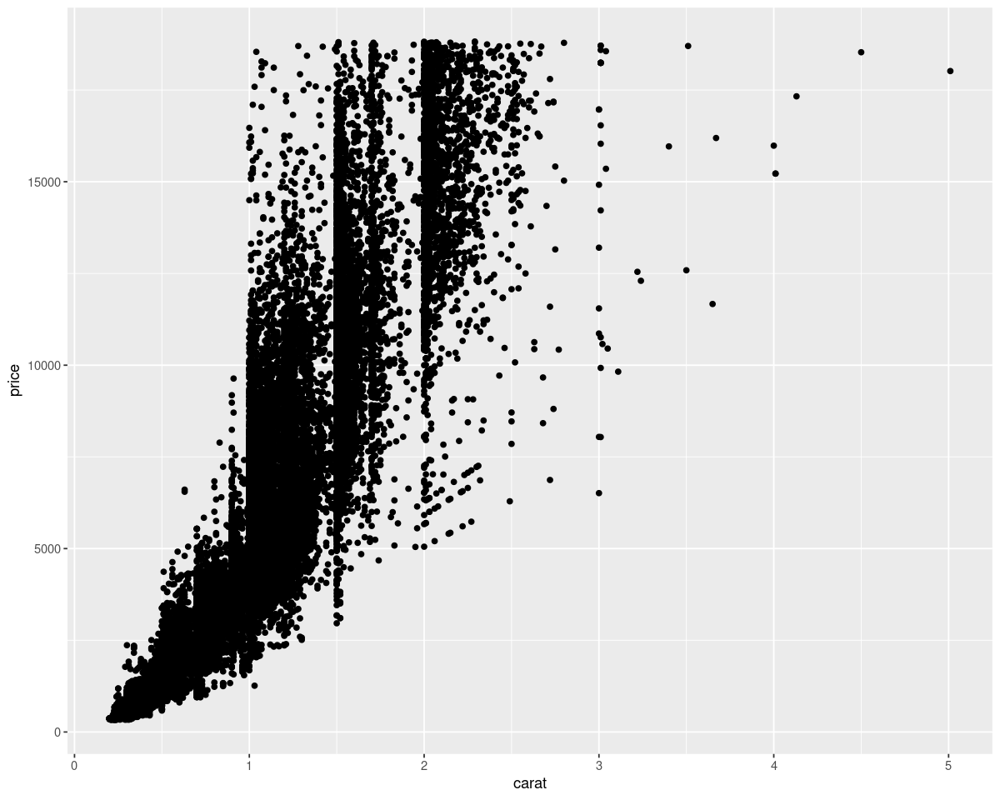

In [4]:
ggplot(diamonds, aes(x = carat, y = price)) + geom_point()


### Ejercicio 1: Mapeando datos. 
Uno de los principios de la *gramática de los gráficos* es "Los gráficos más utiles se optienen mediante un buen *mapeado estético*". Efectivamente, podemos añadir más información al gráfico realizando nuevos mapeados. Por ejemplo, podemos emplear los atributos estéticos *color* y *size*. **Modifica la gráfica anterior mapeando la variable *cut* a *color* y la variable *depth* a *size* **.

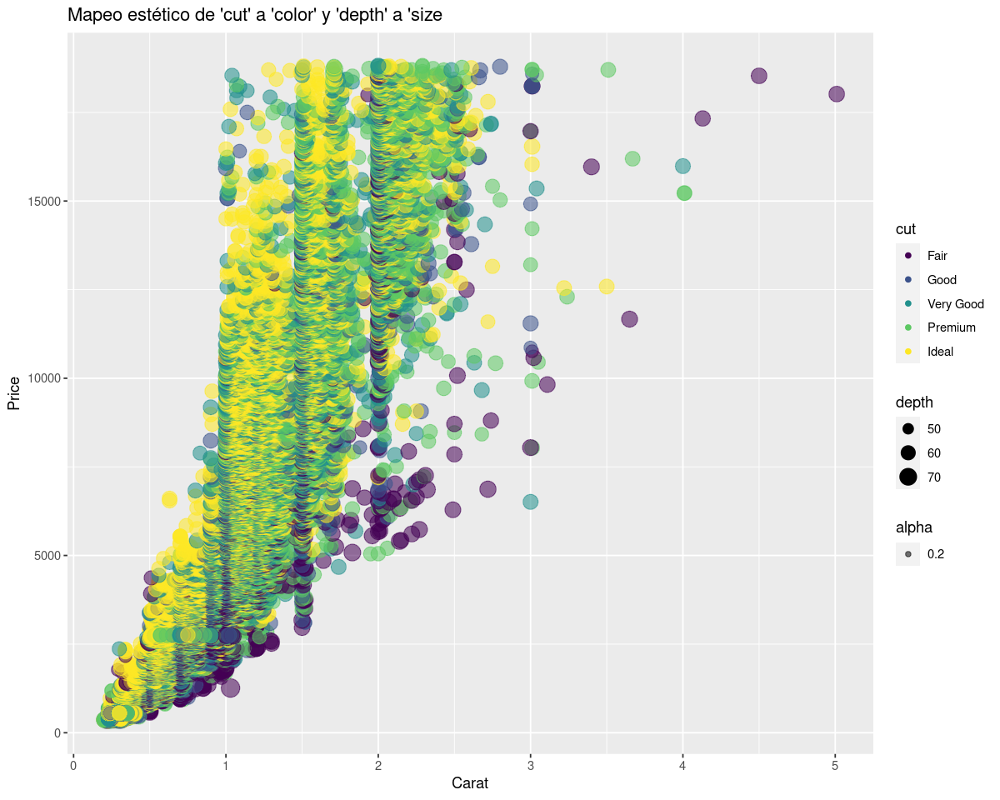

In [5]:
# Escribe la solución. Usa el data.frame diamonds


# Definir una paleta de colores personalizada para 'cut'
# custom_colors <- c("Ideal" = "pink", "Premium" = "bronw", "Very Good" = "green", "Good" = "blue", "Fair" = "orange")

# Definir una paleta de colores pastel para 'cut'
custom_colors <- c("Ideal" = "#FFB6C1", "Premium" = "#D2B48C", "Very Good" = "#98FB98", "Good" = "#87CEFA", "Fair" = "#FFA500")

ggplot(diamonds, aes(x = carat, y = price, color = cut, size = depth, alpha = 0.2)) +
  geom_point() +
#  scale_color_manual(values = custom_colors) +  # Asignar colores personalizados
  labs(title = "Mapeo estético de 'cut' a 'color' y 'depth' a 'size",
       x = "Carat",
       y = "Price")


Una vez completes el ejercicio, fíjate que **ggplot** ha incorporado una leyenda para las variables de color y tamaño de forma automática. Por otra parte, esta gráfica es un claro ejemplo de gráfica en el que hemos incorporado demasiada información. El tamaño de los puntos no permite apreciar de forma efectiva cómo influye *Depth* en  el precio de los diamantes, en gran parte debido a que muchos puntos se solapan. Vamos a intentar mejorar el dibujo en este sentido.

### Ejercicio 2: Atributos.
Para mejorar el gráfico anterior vamos a modificar la forma de los puntos y su transparencia. En los ejemplos anteriores cada elemento estético varía en función de la variable en la cuál había sido mapeado. Lo que pretendemos en este ejercicio es completamente distinto, ya que estableceremos el valor de una variable estética sin mapeo. Para diferenciar estas dos situaciones se habla de propiedades-estéticas (*aesthetics*) y atributos (*attributes*). Para modificar el atributo "forma" podemos usar: 

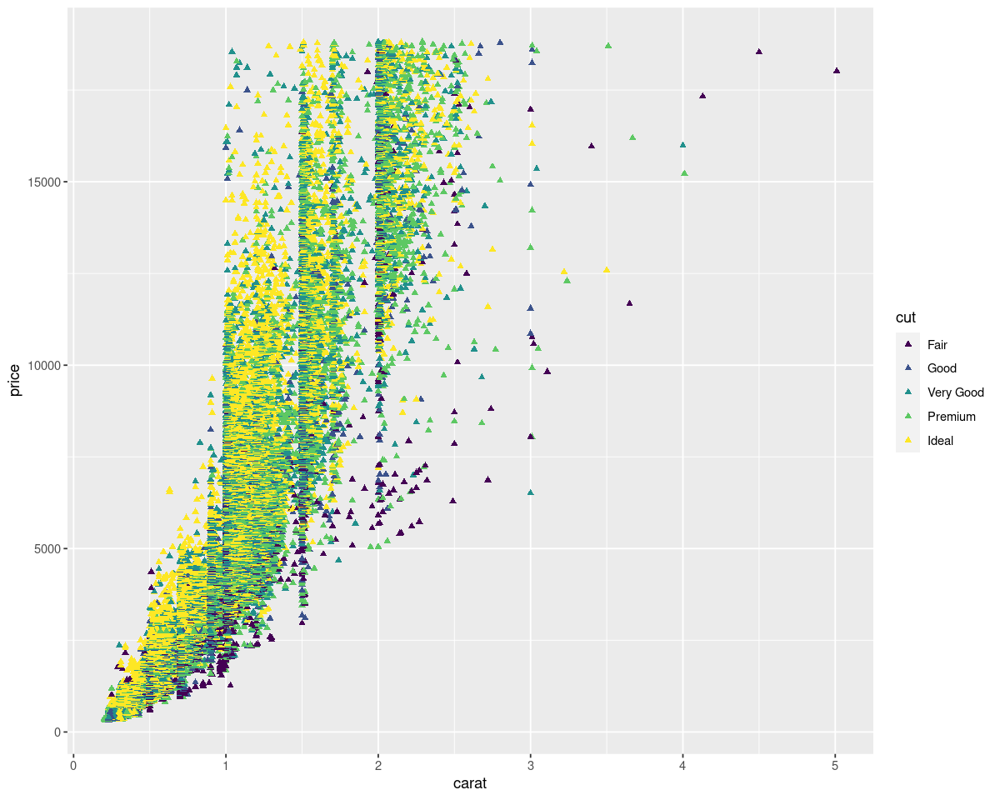

In [6]:
# Ejemplo:
ggplot(diamonds, aes(x = carat, y = price, color=cut)) + geom_point(shape = 17)

Fíjate en que en este caso, *shape* no está incluído dentro de la función *aes*. Como consecuencia, *shape* no ha sido incluída en la leyenda. 

**Modifica el plot anterior estableciendo el valor del atributo tamaño (*size*) a 1 y el valor de la transparencia (*alpha*) a 0.2. Es una buena práctica el uso de transparencia cuando hay solapamiento (overplotting)**

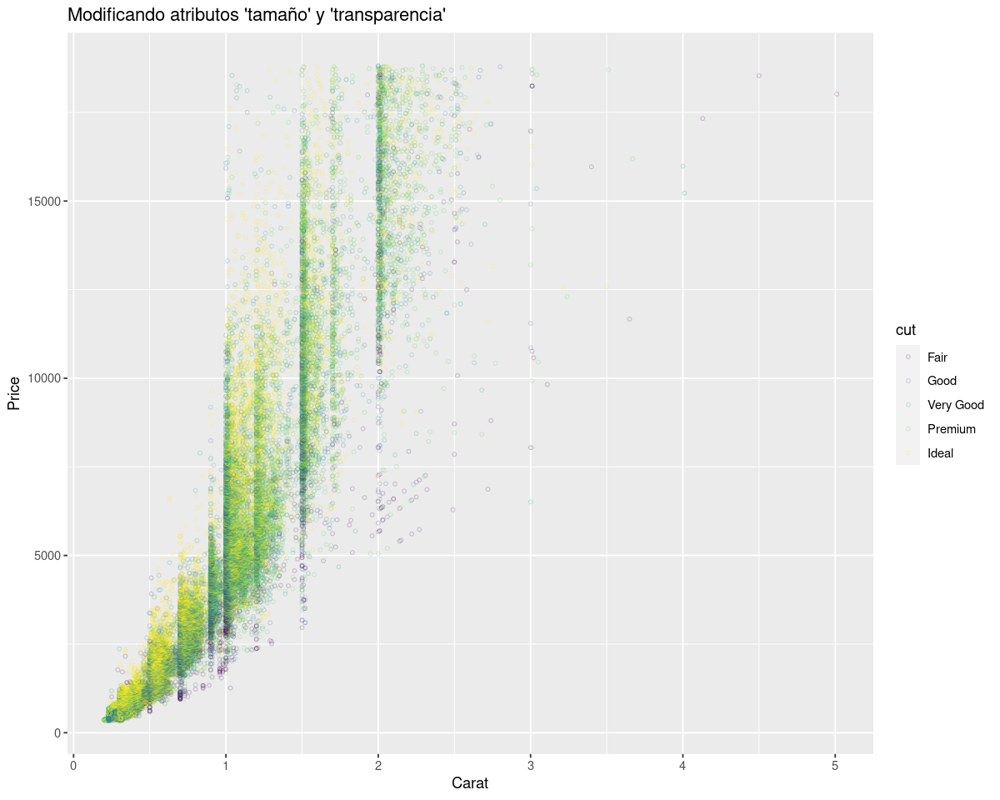

In [7]:
# Escribe la solución. Usa el data.frame diamonds

# Crea el gráfico estableciendo el atributo "tamaño" a 1 y "transparencia" a 0.2
ggplot(diamonds, aes(x = carat, y = price, color = cut, size = 1, alpha = 0.2)) +
  geom_point(shape = 1, size = 1, alpha = 0.2) +
  labs(
    title = "Modificando atributos 'tamaño' y 'transparencia'",
    x = "Carat",
    y = "Price"
  )

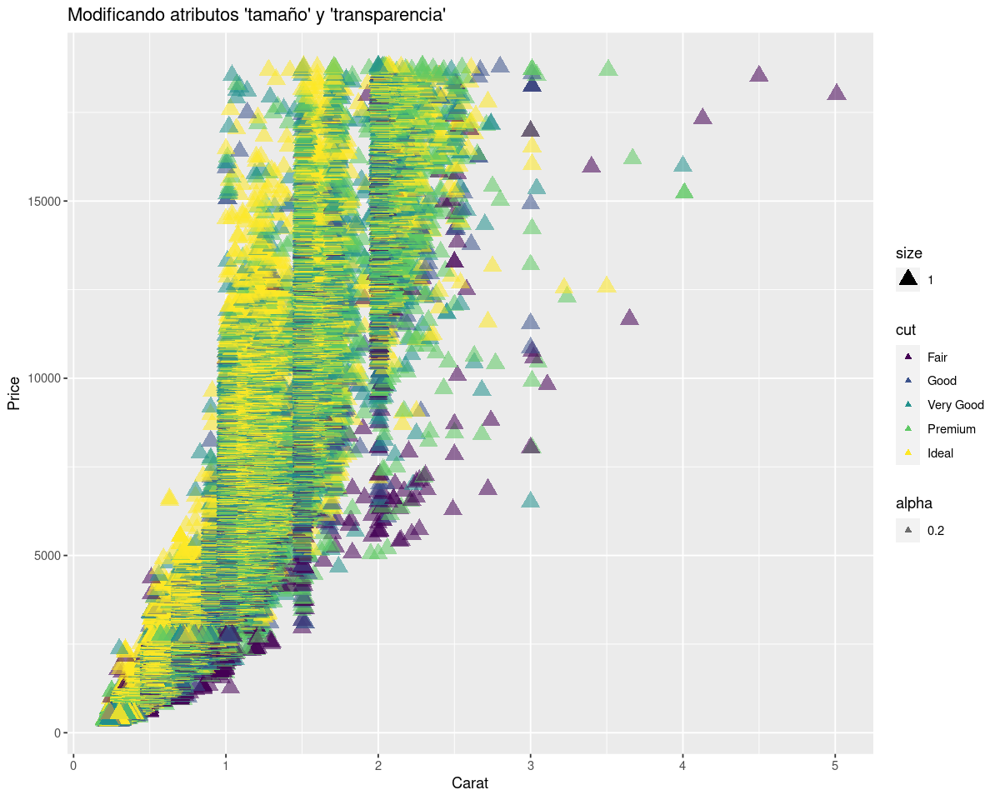

In [8]:


# Crea el gráfico estableciendo el atributo "tamaño" a 1 y "transparencia" a 0.2
ggplot(diamonds, aes(x = carat, y = price, color = cut, size = 1, alpha = 0.2)) +
  geom_point(shape = 17) +
  labs(
    title = "Modificando atributos 'tamaño' y 'transparencia'",
    x = "Carat",
    y = "Price"
  )


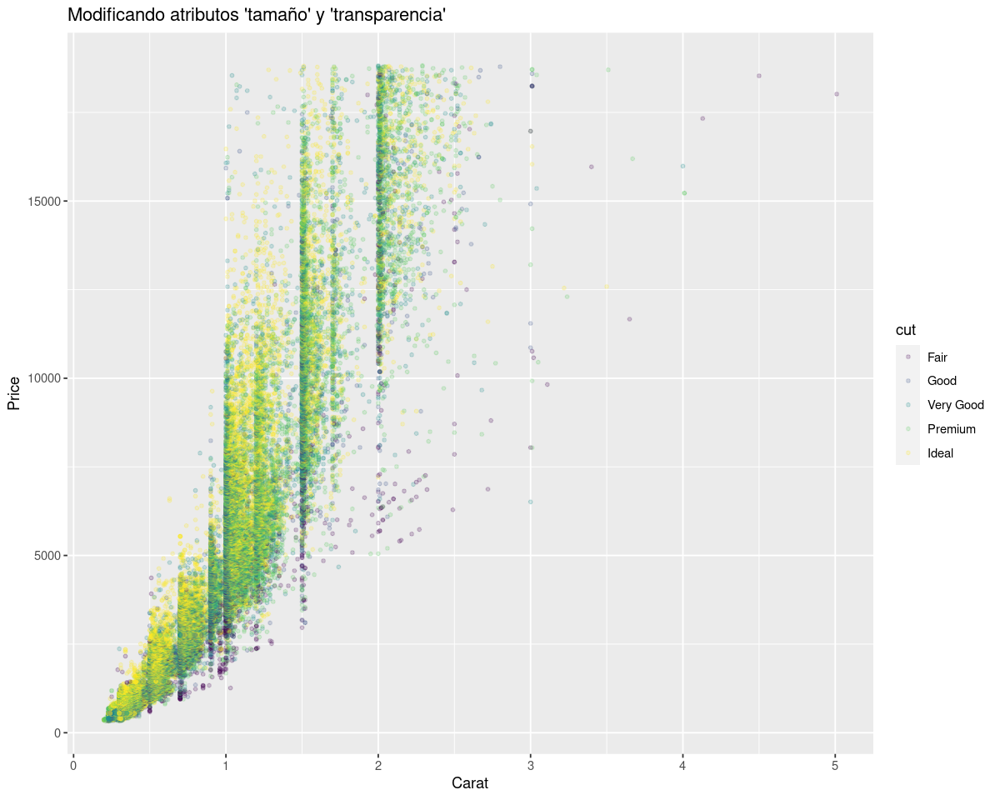

In [9]:
# Crea el gráfico estableciendo el atributo "tamaño" a 1 y "transparencia" a 0.2
ggplot(diamonds, aes(x = carat, y = price, color = cut)) +
  geom_point(size = 1, alpha = 0.2) +
  labs(
    title = "Modificando atributos 'tamaño' y 'transparencia'",
    x = "Carat",
    y = "Price"
  )

### Ejercicio 3: más geometrías
Para terminar con esta primera parte de la práctica vamos repasar los mapeos y a explorar nuevas geometrías mediante el *data.frame meat*, que contiene datos acerca del consumo de diversos tipos de carne en Estados Unidos. Para leerlo empleamos la función *read.csv*, especificando el formato de cada una de las columnas:

In [10]:
meat=read.csv('meat.csv', colClasses = c('Date', rep( 'numeric', 7)))
print(head(meat))

        date beef veal pork lamb_and_mutton broilers other_chicken turkey
1 1944-01-01  751   85 1280              89       NA            NA     NA
2 1944-02-01  713   77 1169              72       NA            NA     NA
3 1944-03-01  741   90 1128              75       NA            NA     NA
4 1944-04-01  650   89  978              66       NA            NA     NA
5 1944-05-01  681  106 1029              78       NA            NA     NA
6 1944-06-01  658  125  962              79       NA            NA     NA


**Crea un gráfico temporal para el consumo de carne vacuna (*beef*) usando la geometría geom_line. Guarda el resultado en una variable auxiliar.**

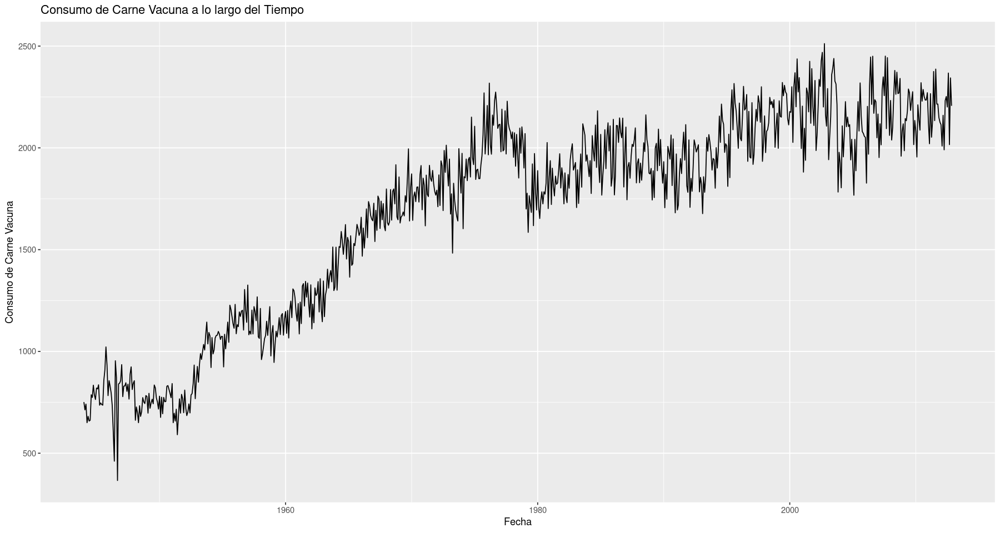

In [11]:
meat$date <- as.Date(meat$date)
options(repr.plot.width=15, repr.plot.height=8)
# Crear el gráfico usando ggplot2
p <- ggplot(meat, aes(x = date, y = beef)) +
  geom_line() +  # Usa geom_line para un gráfico de líneas
  ggtitle("Consumo de Carne Vacuna a lo largo del Tiempo") +
  xlab("Fecha") +
  ylab("Consumo de Carne Vacuna")

# Mostrar el gráfico
print(p)

Es posible insertar varias capas con distintas geometrías o incluso estadísticos. 

**Por ejemplo, usando la variable auxiliar creada en el anterior snippet, añade a la serie temporal un *scatterplot* de los datos (con 'geom_point()') y una regresión (con 'geom_smooth')**

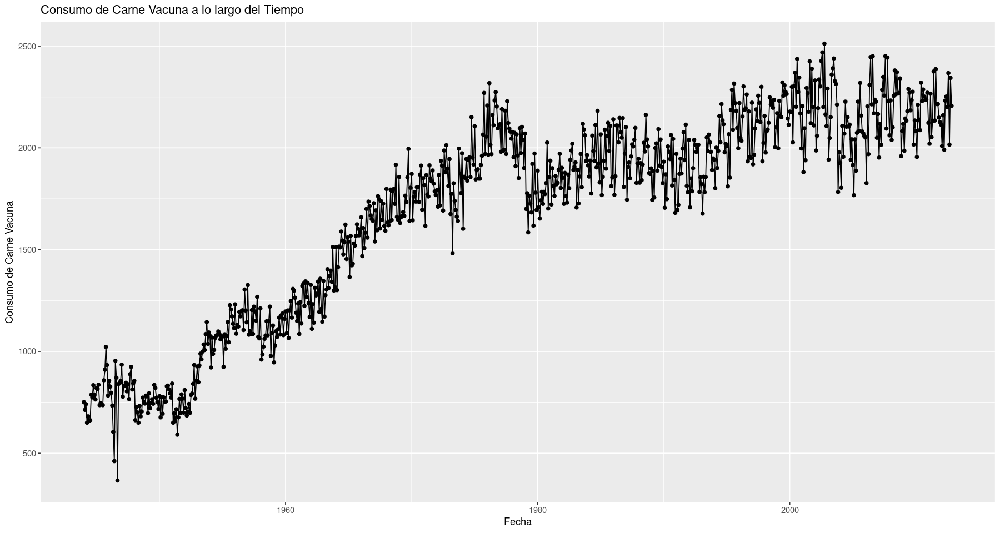

In [12]:
# Escribe aquí la solución
# Añadir un scatterplot a la serie temporal
p <- p + geom_point()
print(p)


`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


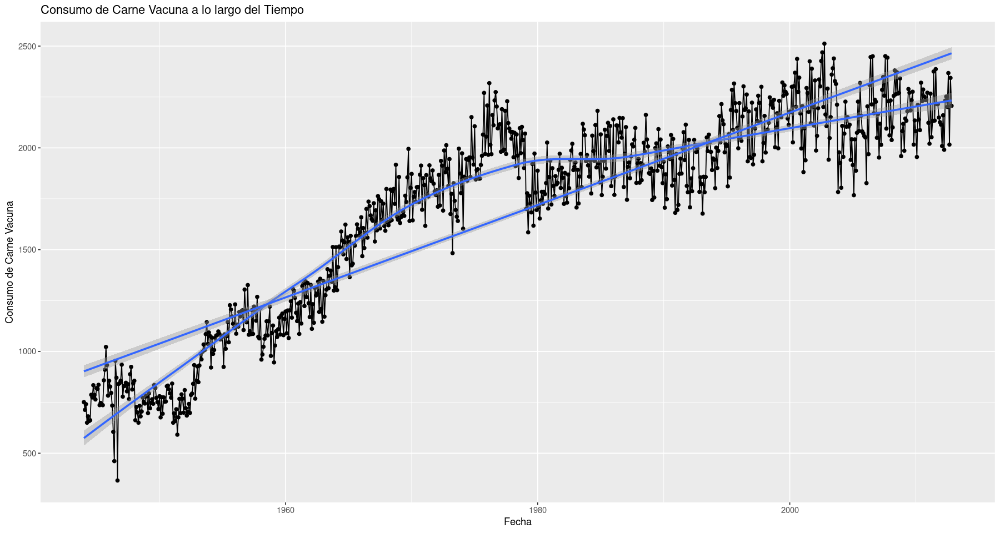

In [13]:
# Añadir una línea de regresión al gráfico
# Por defecto, geom_smooth() usa una regresión local con intervalos de confianza: 
# Por defecto, usa method = 'loess' y formula = 'y ~ x'
p_loess <- p + geom_smooth(method = 'loess')
# Mostrar el gráfico con las capas adicionales
#print(p_loess)
# Añadir una línea de regresión al gráfico
# geom_smooth() usando una regresión lineal con intervalos de confianza
p_lm <- p_loess + geom_smooth(method = "lm", se = TRUE)

# Mostrar el gráfico con las capas adicionales
print(p_lm)

**Cambia los atributos color de la regresión ('red') y el grosor de la línea (parámetro *size*, con valor 0.5)**. Recuerda que no debes usar la función *aes* ya que no estamos trabajando con *aesthetics*.

Warning message:
“Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead.”
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'


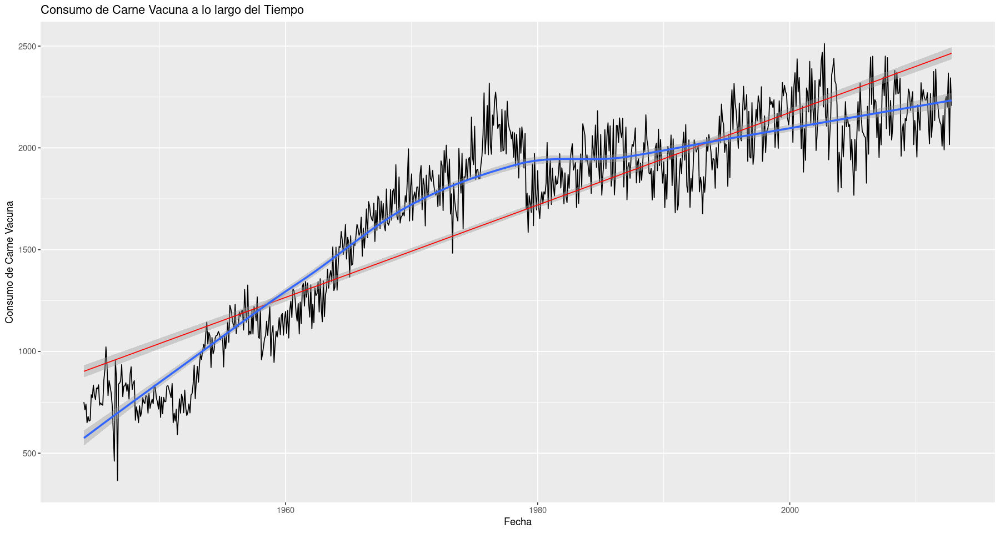

In [14]:
# Escribe aquí la solución
# Crear el gráfico  para limpiarlo
p <- ggplot(meat, aes(x = date, y = beef)) +
  geom_line() +  # Usa geom_line para un gráfico de líneas
  ggtitle("Consumo de Carne Vacuna a lo largo del Tiempo") +
  xlab("Fecha") +
  ylab("Consumo de Carne Vacuna")
# Añade una línea de regresión con color rojo y grosor de línea 0.5
p <- p + geom_smooth(method = "lm", se = TRUE, color = "red", size = 0.5)
p <- p + geom_smooth()
# Mostrar el gráfico con las capas adicionales
print(p)


### Ejercicio 4: 
Por defecto, *geom_smooth* usa [regresión local (o loess)](https://en.wikipedia.org/wiki/Local_regression) para obtener la regresión. La cantidad de puntos locales empleados en la regresión se puede controlar con el parámetro *span*. **Modifica el parámetro 'span' para observar cómo afecta a la regresión. Elimina el intervalo de confianza poniendo el parámetro 'se' a 'FALSE'**.

`geom_smooth()` using formula = 'y ~ x'
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“k-d tree limited by memory. ncmax= 827”
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


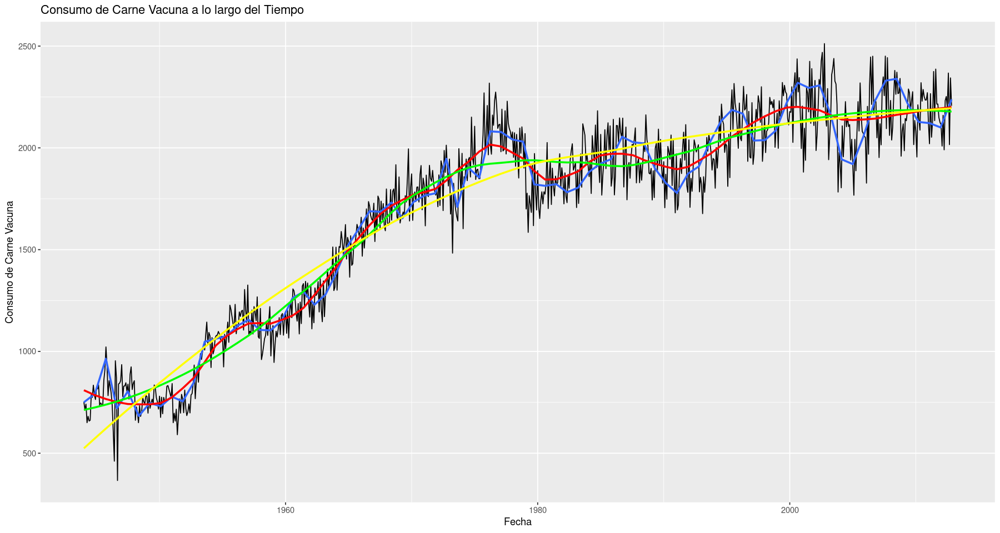

In [15]:
# Escribe aquí la solución
# Crear el gráfico usando ggplot2 para limpiarlo
p <- ggplot(meat, aes(x = date, y = beef)) +
  geom_line() +  # Usa geom_line para un gráfico de líneas
  ggtitle("Consumo de Carne Vacuna a lo largo del Tiempo") +
  xlab("Fecha") +
  ylab("Consumo de Carne Vacuna")


# Modificar geom_smooth para usar una regresión loess con un span específico y sin intervalos de confianza
p <- p + geom_smooth(method = "loess", span = 0.01, se = FALSE)+
    geom_smooth(method='loess', color='red', span=0.2, se=FALSE) + 
    geom_smooth(method='loess', color='green', span=0.5, se=FALSE) + 
    geom_smooth(method='loess', color='yellow', span=0.9, se=FALSE)

# Mostrar el gráfico
print(p)

**Comentario**

Al utilizar diferentes valores de 'span' se observan variaciones en la suavidad de la curva de regresión. Un span más bajo, como 0.01, produce una curva más ajustada y detallada que sigue de cerca las fluctuaciones de los datos, lo cual es evidente en la curva roja. Por otro lado, un span más alto, como 0.9, resulta en una curva más suave y generalizada que captura la tendencia global sin enfocarse en variaciones menores, como se ve en la curva amarilla. Esto demuestra la flexibilidad y sensibilidad de la regresión LOESS para modelar diferentes niveles de detalle en los datos.

# La capa de los datos

Imaginemos que deseamos dibujar el consumo de los distintos tipos de carne presentes en el *data.frame* *meat* a lo largo del tiempo. La forma *naive* que a muchos de nosotros se nos ocurriría realizar este tipo de plot explota el hecho de que podemos sobreescribir los mapeos realizados anteriormente en las distintas capas que componen el gráfico:

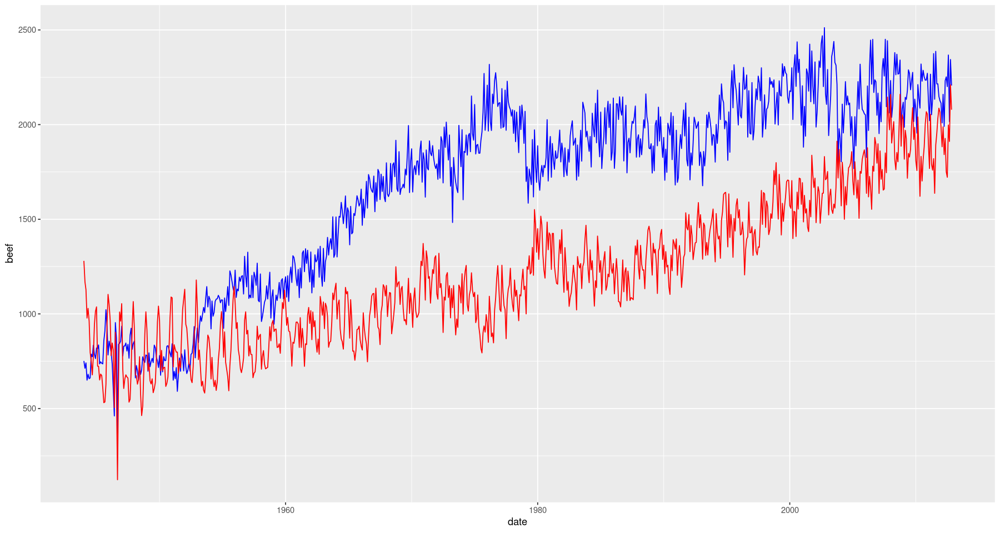

In [16]:
ggplot(meat, aes(x=date, y = beef)) + geom_line(color = 'blue') + 
      geom_line(aes(x=date, y = pork), color = 'red') 
### etc. ¡Aun quedan muchos tipos de carne! :'(

Además de ser muy poco práctico (aún tendríamos que añadir las capas correspondientes a los restantes tipos de carne) esta es una forma incorrecta de realizar el gráfico (al menos desde la filosofía de la *gramática de los gráficos*). Las variables que hemos dibujado en el eje *y* han sido:

1. Consumo de carne vacuna.
2. Consumo de carne de cerdo.

Así pues lo que realmente queremos dibujar en el eje *y* es *consumo de carne*. ¡Esto implica que nuestra capa de datos no está en formato apropiado para lo que deseamos representar y estudiar! Este es un problema que suele presentarse a menudo estrechamente relacionado con dos formas de presentar los datos en formato tabular: [long vs wide](https://en.wikipedia.org/wiki/Wide_and_narrow_data). En el caso que nos ocupa, un *data.frame* adecuado a nuestros intereses tendría el formato:


| date       | meat_type | consumption |
|------------|-----------|-------------|
| 1944-01-01 | beef      | 751         |
| 1944-02-01 | beef      | 13          |
| ...        | ...       | ...         |
| 1944-01-01 | veal      | 85          | 



Para pasar entre formatos *wide* y *long* podemos emplear la librería de R *reshape2*. En este [link](http://seananderson.ca/2013/10/19/reshape.html) puedes encontrar más información sobre *reshape2* y los formatos *long* y *wide*. Para pasar a formato long, simplemente debemos usar:


In [17]:
# Instalar tidyr si no está instalado
# install.packages("reshape2")
library('reshape2')
meat_long = melt(meat, id.vars = 'date')
colnames(meat_long) = c('date', 'meat_type', 'consumption')
head(meat_long)

,date,meat_type,consumption
,<date>,<fct>,<dbl>
1,1944-01-01,beef,751
2,1944-02-01,beef,713
3,1944-03-01,beef,741
4,1944-04-01,beef,650
5,1944-05-01,beef,681
6,1944-06-01,beef,658


### Ejercicio 5: 

Usando la nueva tabla, crea un gráfico mostrando el consumo de los distintos tipos de carnes a lo largo del tiempo. Mapea cada tipo de carne con un color distinto. 

[colores](https://r-graph-gallery.com/38-rcolorbrewers-palettes.html)


Attaching package: ‘tidyr’


The following object is masked from ‘package:reshape2’:

    smiths


Loading required package: viridisLite

Warning message:
“Removed 1068 rows containing missing values (`geom_line()`).”


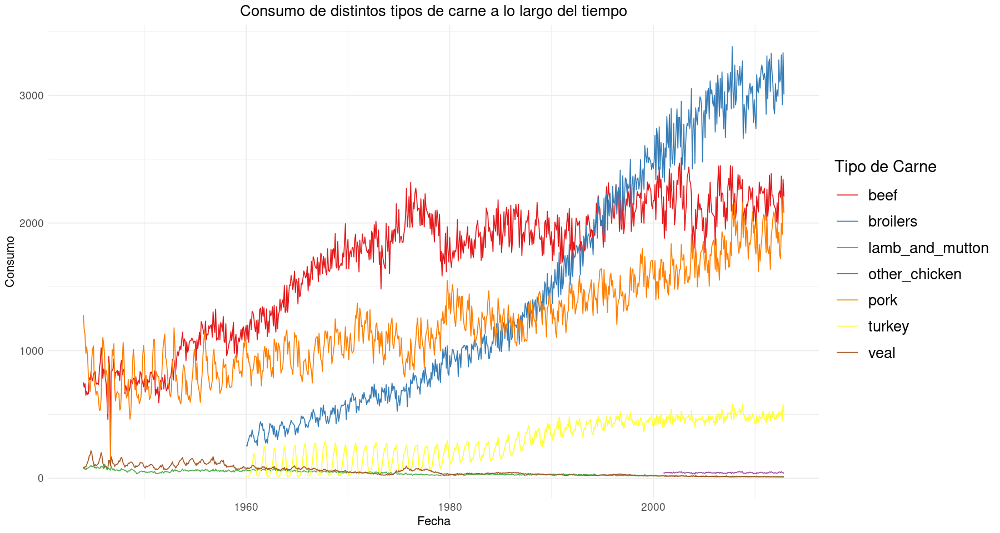

In [18]:
# Instalar tidyr si no está instalado
# install.packages("tidyr")

# Cargar las librerías necesarias
library(tidyr)
# Cargar la librería viridis para paletas de colores
library(viridis)
mis_colores <- c("beef" = "#1b9e77", "veal" = "#d95f02", "pork" = "#7570b3", 
                 "lamb_and_mutton" = "#e7298a", "broilers" = "#d95f02" 
                 , "other_chicken" = "#d95f02", "turkey" = "#d95f02")


# Transformar los datos a formato largo
meat_long <- pivot_longer(meat, cols = -date, names_to = "meat_type", values_to = "consumption")

# Crear el gráfico
meat_graf <-ggplot(meat_long, aes(x = date, y = consumption, color = meat_type)) +
  geom_line() +
  #scale_color_viridis(discrete = TRUE) +  # Utiliza una paleta de viridis
  scale_color_brewer(palette = "Set1") +  # Utiliza la paleta de RColorBrewer
  #scale_color_manual(palette = mis_colores) +  # Utiliza la paleta de manual
  scale_alpha_manual(values = c(0.5, 0.7, 0.9, 1.0)) +  # Valores personalizados para alpha
  theme_minimal() +
  labs(title = "Consumo de distintos tipos de carne a lo largo del tiempo",
       x = "Fecha",
       y = "Consumo",
       color = "Tipo de Carne") +
  theme(
    plot.title = element_text(size = rel(1.5), hjust = 0.5),   # Ajusta el tamaño del título
    axis.title.x = element_text(size = rel(1.2)), # Ajusta el tamaño de la etiqueta del eje x
    axis.title.y = element_text(size = rel(1.2)), # Ajusta el tamaño de la etiqueta del eje y
    axis.text.x = element_text(size = rel(1.3)),  # Aumenta el tamaño del texto del eje X
    axis.text.y = element_text(size = rel(1.3)),  # Aumenta el tamaño del texto del eje Y
    legend.title = element_text(size = rel(1.6)), # Ajusta el tamaño del título de la leyenda
    legend.key.size = unit(1, "cm"),              # Ajusta el tamaño de las claves de la leyenda
    legend.text = element_text(size = rel(1.5))               # Aumenta el tamaño de la letra de las etiquetas de la leyenda
  ) + guides(color = guide_legend(override.aes = list(size = 5)))
    

print(meat_graf)


Una vez completes el ejercicio observa que, a diferencia de nuestro gráfico anterior, esta vez aparece una leyenda (¡una buena señal de que lo estamos haciendo bien!). Una vez creado el gráfico, **guardalo en una variable auxiliar y luego modifícala añadiendo un *geom_smooth*. Observa que ggplot crea una regresión para cada tipo de carne. Mejora el gráfico eliminando los intervalos de confianza.**

`geom_smooth()` using formula = 'y ~ x'
Warning message:
“Removed 1068 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 1068 rows containing missing values (`geom_line()`).”


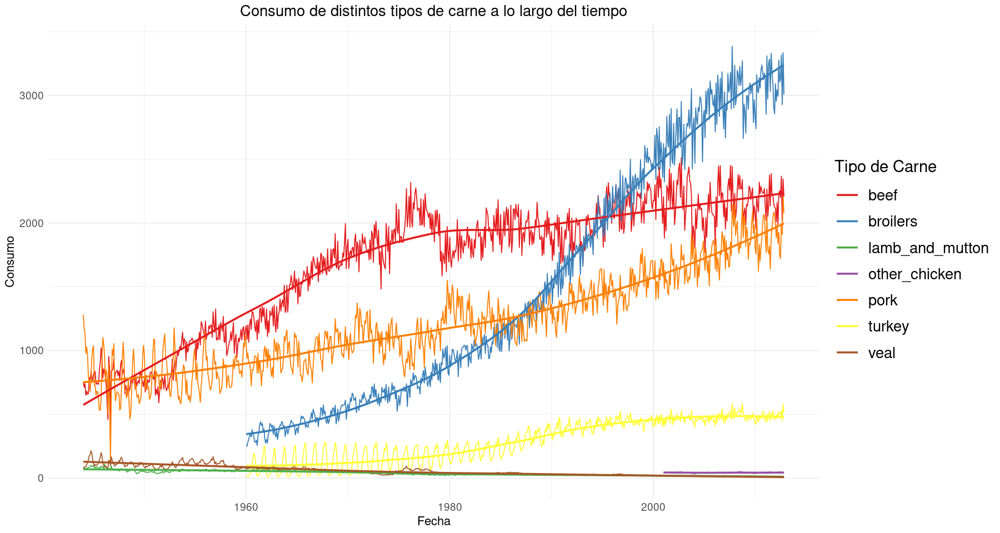

In [19]:

# Añadir geom_smooth sin intervalos de confianza
meat_graf_r <- meat_graf + geom_smooth(method = "loess", se = FALSE)

# Mostrar el gráfico
print(meat_graf_r)


**COMENTARIO**

 Los tipos de carne tienen tendencias distintas. El consumo de carne de res (beef), cerdo pork) y de pollos (broilers) muestra un aumento significativo a lo largo del tiempo, mientras que otros tipos de carne, como el cordero y la ternera (lamb_and_mutton, veal), permanecen relativamente estables (bajos) o disminuyen.
 
Hay un cambio en las preferencias de coonsumo. El aumento dramático en el consumo de pollos ('broilers') sugiere un cambio significativo en las preferencias de los consumidores a lo largo de las décadas. Esto podría reflejar factores económicos, como cambios en el costo relativo de diferentes carnes, o un cambio en la percepción pública hacia opciones percibidas como más saludables o más éticas.
 

# Geometrías

Ya hemos trabajado un poco con distintas geometrías como *geom_point* o *geom_line*. En esta sección estudiaremos algunos problemas que pueden surgir con estas geometrías y exploraremos algunas nuevas.

## *Scatterplots*

En esta sección vamos a explorar el dataset *Vocab*, que os facilitamos en formato csv. Este dataset continene información acerca de los años de educación recibidos y una puntuación (un número entero) en un test de vocabulario realizado con más de 21,000 individuos en Estados Unidos durante 1972-2004. Importamos el dataset haciendo uso de la función *read.csv*:


In [20]:
vocab = read.csv('Vocab.csv', colClasses=c('numeric', 'character', 'numeric', 'numeric'))
head(vocab)

,year,sex,education,vocabulary
,<dbl>,<chr>,<dbl>,<dbl>
1,2004,Female,9,3
2,2004,Female,14,6
3,2004,Male,14,9
4,2004,Female,17,8
5,2004,Male,14,1
6,2004,Male,14,7


### Ejercicio 6: Dibuja un *scatterplot* de la puntuación en el test (*vocabulary*) en función del número de años de estudios (*scatterplot*). ¿Observas algún problema en la representación?

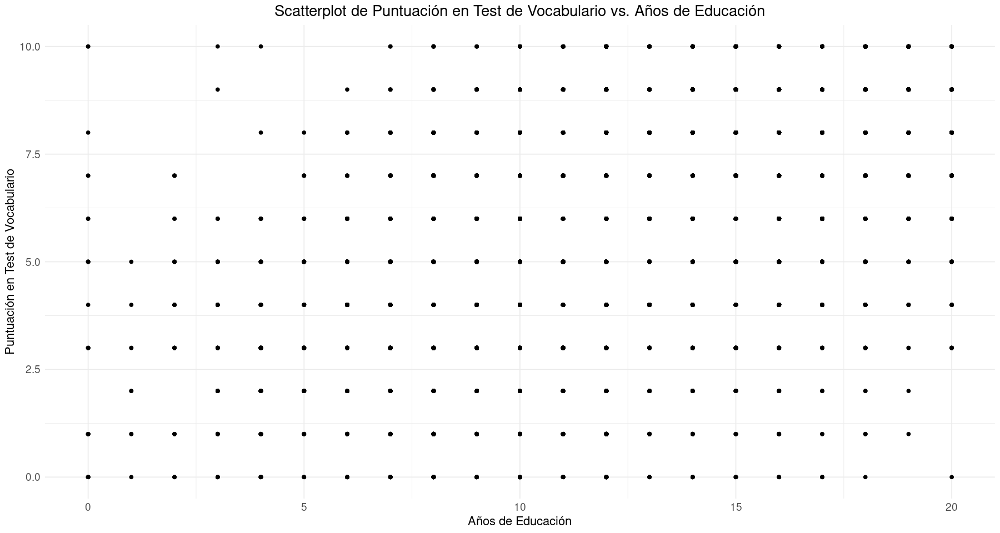

In [21]:
# Intenta resolver el ejercicio antes de seguir leyendo
# Escribe aquí la solución, usa el dataset vocab
# Asegúrate de tener cargada la librería ggplot2 y de haber importado el dataset 'Vocab'

# Crear un scatterplot
ggplot(vocab, aes(x = education, y = vocabulary)) +
    geom_point() +
    theme_minimal() +
    labs(
        title = "Scatterplot de Puntuación en Test de Vocabulario vs. Años de Educación",
        x = "Años de Educación",
        y = "Puntuación en Test de Vocabulario"
    )+ 
    theme(plot.title = element_text(size = rel(1.5), hjust = 0.5),
        axis.title.x = element_text(size = rel(1.2)), # Ajusta el tamaño de la etiqueta del eje x
        axis.title.y = element_text(size = rel(1.2)), # Ajusta el tamaño de la etiqueta del eje y)
        axis.text.x = element_text(size = rel(1.3)),  # Aumenta el tamaño del texto del eje X
        axis.text.y = element_text(size = rel(1.3))   # Aumenta el tamaño del texto del eje Y
         )

Es obvio que tenemos un problema de *overplotting* debido a que las puntuaciones son números enteros. En este caso, no podemos solucionar el *overplotting* mediante el uso de transparencia. Lo que sí podemos hacer es intentar modificar levemente la posición de cada punto añadiendo un poco de ruido. A este procedimiento se le conoce como **jittering**.  Afortunadamente, al igual que podemos modificar el color o la forma de un punto, ggplot también nos permite modificar la posición de algunas geometrías mediante el atributo *position*.

### Ejercicio 7: 

Modifica el *plot* anterior añadiéndole *jittering*. Para ello establece el atributo *position='jitter'* dentro  de *geom_point*.  Con *jittering* sí tiene sentido aplicar transparencia,  así que añade una poca.


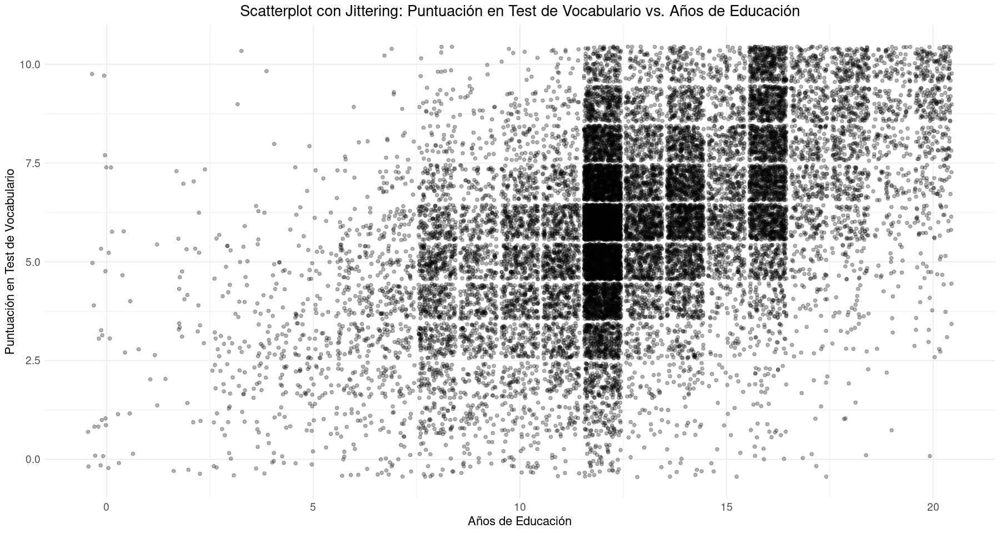

In [22]:
# Escribe aquí la solución, usa el dataset vocab
# Crear un scatterplot con jittering y transparencia
vocab_jittering<-ggplot(vocab, aes(x = education, y = vocabulary)) +
    geom_point(position = position_jitter(width = 0.45, height = 0.45), alpha = 0.3) +  # Aplicar jittering y transparencia
    theme_minimal() +
    labs(
        title = "Scatterplot con Jittering: Puntuación en Test de Vocabulario vs. Años de Educación",
        x = "Años de Educación",
        y = "Puntuación en Test de Vocabulario"
    )+ 
    theme(plot.title = element_text(size = rel(1.5), hjust = 0.5),
        axis.title.x = element_text(size = rel(1.2)), # Ajusta el tamaño de la etiqueta del eje x
        axis.title.y = element_text(size = rel(1.2)), # Ajusta el tamaño de la etiqueta del eje y)
        axis.text.x = element_text(size = rel(1.3)),  # Aumenta el tamaño del texto del eje X
        axis.text.y = element_text(size = rel(1.3))   # Aumenta el tamaño del texto del eje Y
         )
vocab_jittering

Con el último *plot* podemos hacernos una idea de la posible relación existente entre *vocabulary* y *education*: ¡parece que la puntuación obtenida aumenta con los años de educación!

### Ejercicio 8: 

Confirma que los años de educación aumentan (en término medio) la puntuación de los alumnos añadiendo una regresión a la gráfica anterior (*geom_smooth*). Usa el atributo *method* para  especificar que quieres hacer una regresión lineal ('lm'). 



`geom_smooth()` using formula = 'y ~ x'


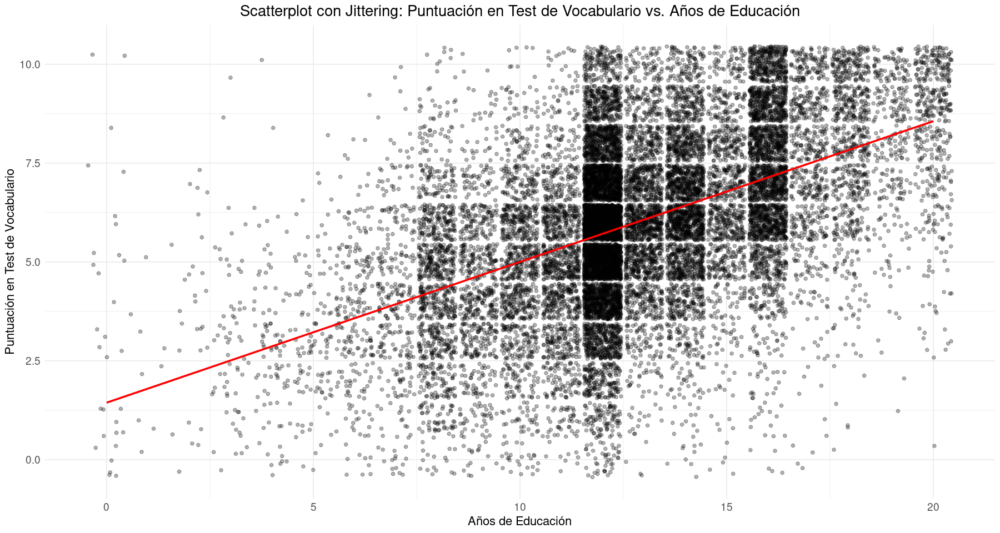

In [23]:
# Escribe aquí la solución
# Crear un scatterplot con jittering, transparencia y una regresión lineal
vocab_jittering+geom_smooth(method = "lm", se = FALSE, color = "red")

**Comentario**

La línea de regresión lineal sugiere una correlación positiva entre la educación y la puntuación en el test de vocabulario. Esto implica que, en promedio, a más años de educación, mejor es la puntuación en el test de vocabulario.

¡Una buena gráfica puede ser la mejor guía para sacar el máximo partido a los datos!

## Histogramas y gráficos de barras

El uso más habitual de la geometría tipo *barra* es la creación de histogramas. Dado que uno de los elementos gramaticales de **ggplot** son los estadísticos (es decir, que **ggplot** puede calcular los estadísticos más comunes por nosotros), realizar un histograma es muy sencillo. El único elemento estético a especificar es *x*: la variable de la que queremos construir el histograma. Por ejemplo, podemos crear un histograma para la variable 'education' mediante el comando:



`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


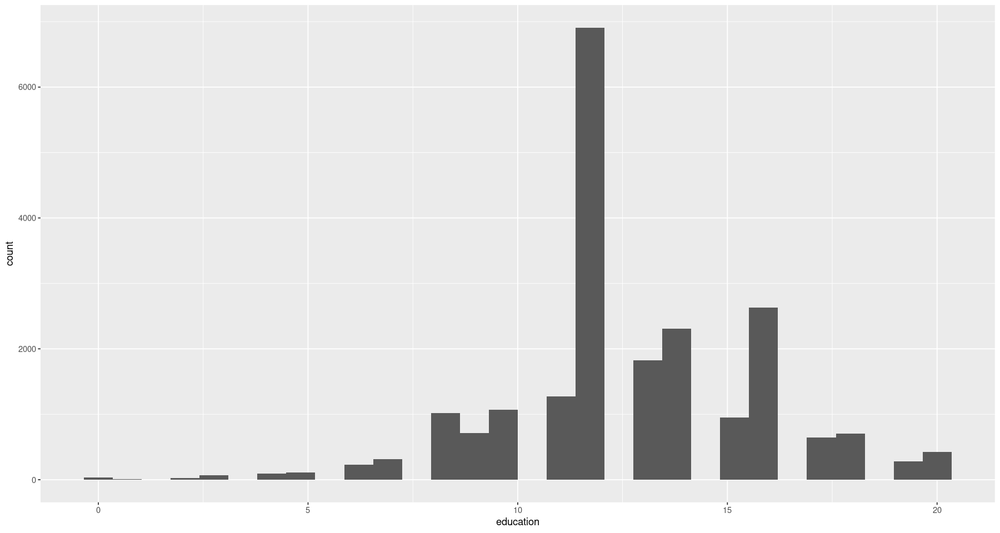

In [24]:
ggplot(vocab, aes(x=education)) + geom_histogram()

**NOTA**

Consultando la documentación de la librería ggplot2, la función geom_histogram() usa por defecto 30 bins. Esta es la razon de que se observen huecos en el histograma, debido a que el número de bins supera al número edades en el DataFrame dejando estos años sin datos. Esto se  arreglr declarando el valor para el argumento bins.

### Ejercicio 9: El histograma anterior sugiere una distribución de edades  un tanto extraña. ¿Realmente existen edades para los que no existan datos? Si no es así, ¿A que pueden deberse los huecos del histograma?

¡¡Recuerda que cualquier gráfica debe ir acompañada de un pensamiento crítico y reflexivo sobre lo que estamos viendo!!

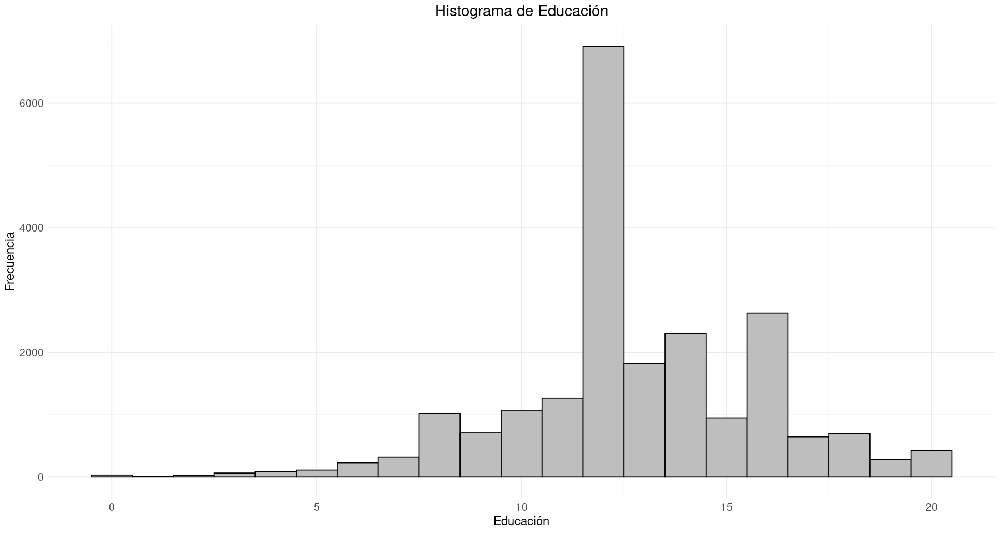

In [25]:
# Intenta solucionar el ejercicio antes de seguir leyendo.
# No tienes porque usar código si crees que no es necesario.
# Crear un histograma de la columna 'education'
ggplot(vocab, aes(x=education)) + 
    geom_histogram(binwidth = 1, color="black", fill="grey") +
    labs(title="Histograma de Educación", x="Educación", y="Frecuencia") +
    theme_minimal()+ 
    theme(plot.title = element_text(size = rel(1.5), hjust = 0.5),
        axis.title.x = element_text(size = rel(1.2)), # Ajusta el tamaño de la etiqueta del eje x
        axis.title.y = element_text(size = rel(1.2)), # Ajusta el tamaño de la etiqueta del eje y)
        axis.text.x = element_text(size = rel(1.3)),  # Aumenta el tamaño del texto del eje X
        axis.text.y = element_text(size = rel(1.3))   # Aumenta el tamaño del texto del eje Y
         )

**COMENTARIO**

- Moda en la Educación: La barra más alta indica la moda de los datos, que parece ser alrededor de 12 años de educación. Esto podría coincidir con la finalización de la educación secundaria en muchos sistemas educativos, lo que sugiere que una gran proporción de la población en la muestra alcanzó este nivel de educación.

- Distribución Asimétrica: La distribución parece ser asimétrica, con una concentración de frecuencias en el rango medio de años de educación y menos frecuencias en los extremos bajos y altos. Esto podría indicar que hay menos personas con muy poca educación formal o con niveles de educación avanzados como títulos de posgrado.

- Discontinuidades en la Distribución: Hay picos y caídas notables en la frecuencia a medida que aumentan los años de educación. Esto puede reflejar puntos de salida comunes en el sistema educativo, como después de la educación secundaria, la universidad (aproximadamente 16 años), y la escuela de posgrado (alrededor de 18 o más años).



### Ejercicio 10: Compruebe si se puede obtener un histograma mejor eligiendo otro tamaño para los bins. Tras observar los datos que queremos reprensentar ¿Cuál es la mejor elección para *binwidth*?


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union




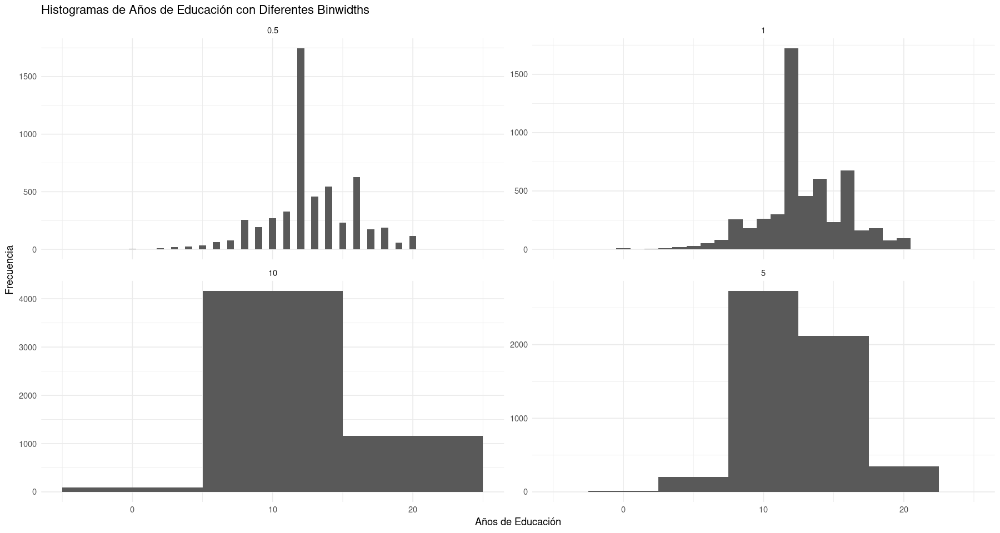

In [26]:
library(dplyr)
# Extender el dataframe con la nueva columna 'position_type'
vocab_extended <- vocab %>%
    mutate(
        position_type = rep(c("0.5", "1", "5", "10"), length.out = nrow(vocab))
    )

# Crear los histogramas con diferentes binwidths
ggplot() +
    geom_histogram(data = subset(vocab_extended, position_type == "0.5"), aes(x = education), binwidth = 0.5, alpha = 1) +
    geom_histogram(data = subset(vocab_extended, position_type == "1"), aes(x = education), binwidth = 1, alpha = 1) +
    geom_histogram(data = subset(vocab_extended, position_type == "10"), aes(x = education), binwidth = 10, alpha = 1) +
    geom_histogram(data = subset(vocab_extended, position_type == "5"), aes(x = education), binwidth = 5, alpha = 1) +
    facet_wrap(~position_type, scales = 'free_y') + 
    theme_minimal() +
    labs(title = "Histogramas de Años de Educación con Diferentes Binwidths",
         x = "Años de Educación",
         y = "Frecuencia")

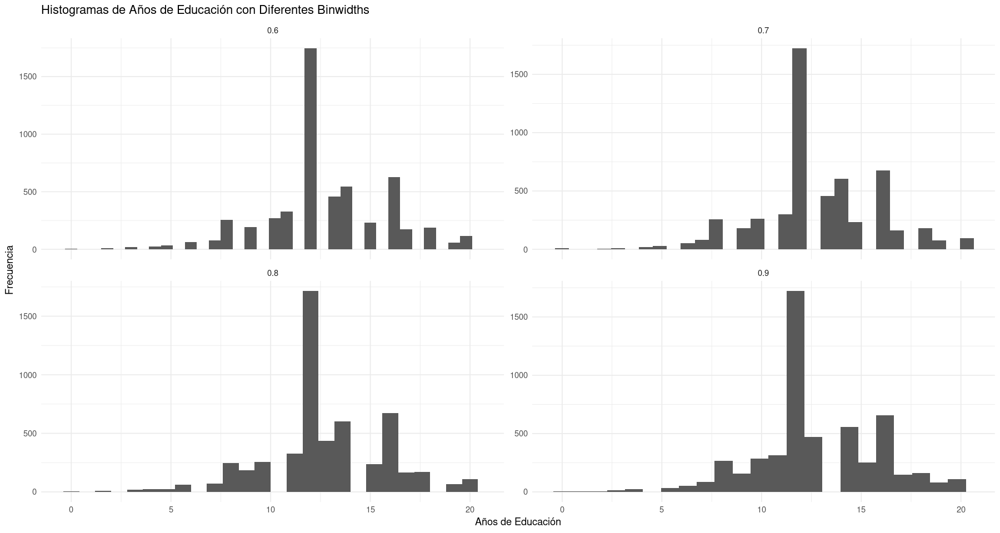

In [27]:
# Extender el dataframe con la nueva columna 'position_type'
vocab_extended <- vocab %>%
    mutate(
        position_type = rep(c("0.6", "0.7", "0.8", "0.9"), length.out = nrow(vocab))
    )

# Crear los histogramas con diferentes binwidths
ggplot() +
    geom_histogram(data = subset(vocab_extended, position_type == "0.6"), aes(x = education), binwidth = 0.6, alpha = 1) +
    geom_histogram(data = subset(vocab_extended, position_type == "0.7"), aes(x = education), binwidth = 0.7, alpha = 1) +
    geom_histogram(data = subset(vocab_extended, position_type == "0.8"), aes(x = education), binwidth = 0.8, alpha = 1) +
    geom_histogram(data = subset(vocab_extended, position_type == "0.9"), aes(x = education), binwidth = 0.9, alpha = 1) +
    facet_wrap(~position_type, scales = 'free_y') + 
    theme_minimal() +
    labs(title = "Histogramas de Años de Educación con Diferentes Binwidths",
         x = "Años de Educación",
         y = "Frecuencia")

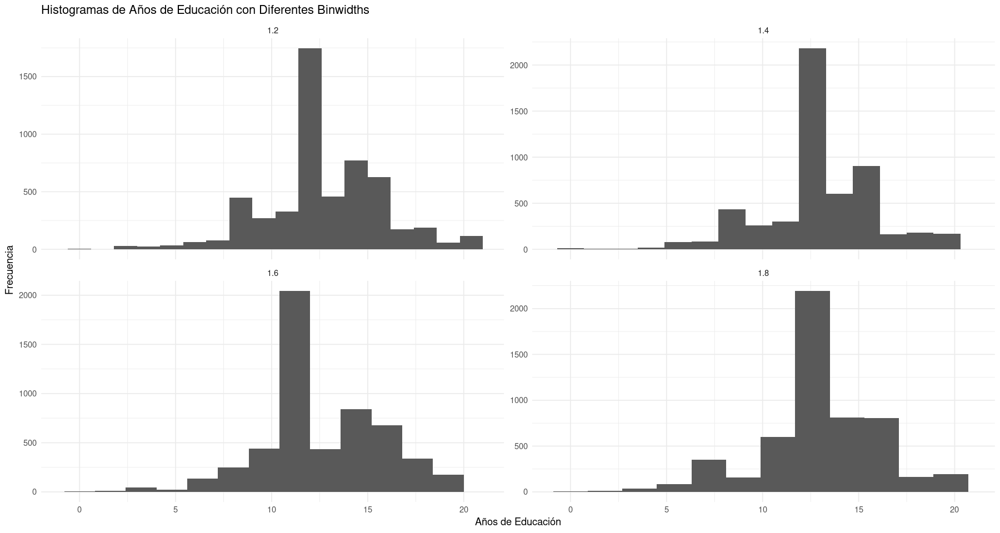

In [28]:
# Extender el dataframe con la nueva columna 'position_type'
vocab_extended <- vocab %>%
    mutate(
        position_type = rep(c("1.2", "1.4", "1.6", "1.8"), length.out = nrow(vocab))
    )

# Crear los histogramas con diferentes binwidths
ggplot() +
    geom_histogram(data = subset(vocab_extended, position_type == "1.2"), aes(x = education), binwidth = 1.2, alpha = 1) +
    geom_histogram(data = subset(vocab_extended, position_type == "1.4"), aes(x = education), binwidth = 1.4, alpha = 1) +
    geom_histogram(data = subset(vocab_extended, position_type == "1.6"), aes(x = education), binwidth = 1.6, alpha = 1) +
    geom_histogram(data = subset(vocab_extended, position_type == "1.8"), aes(x = education), binwidth = 1.8, alpha = 1) +
    facet_wrap(~position_type, scales = 'free_y') + 
    theme_minimal() +
    labs(title = "Histogramas de Años de Educación con Diferentes Binwidths",
         x = "Años de Educación",
         y = "Frecuencia")

**COMENTARIO**

Se seleciona binwidth=1. La principal razón de esta elección radica en la naturaleza de los datos, que son años de educación escolar, típicamente expresados en números enteros. Al optar por un binwidth de uno, cada año de educación se representa con una barra independiente en el histograma. Esta aproximación permite una visualización clara y directa de la frecuencia de cada año específico de educación dentro del conjunto de datos. Por ejemplo, una barra representará la frecuencia de estudiantes que han completado exactamente diez años de educación, otra barra representará aquellos con once años, y así sucesivamente.

Cabe mencionar que, aunque también sería razonable considerar un binwidth entre 1 y 2 para agrupar los años de educación en categorías más amplias, esta opción podría conducir a una pérdida de detalles específicos. Aunque los valores menores a 1 generarían barras sin datos y los mayores a 1 ocasionarían una pérdida de información detallada, se ha concluido que un binwidth de 1 proporciona el equilibrio óptimo. Este tamaño de bin no solo conserva la integridad de los datos individuales, sino que también aporta una riqueza de información esencial para el análisis detallado y la interpretación de las tendencias educativas del grupo estudiado. En resumen, la selección de un binwidth de 1 es la más adecuada para nuestro estudio, ya que maximiza la utilidad y relevancia de la información visualizada.


### Ejercicio 11: Crea una representación de la función de densidad especificando como atributo estético *y=..density..*. Compara el gráfico actual con el histograma que realizamos al principio de la sección.

En este caso *y=..density..* esta pidiendo a ggplot que construya un nuevo mapping-estético con los valores normalizados del histograma, y que emplee dicho atributo en la representación.

Warning message:
“The dot-dot notation (`..density..`) was deprecated in ggplot2 3.4.0.
ℹ Please use `after_stat(density)` instead.”


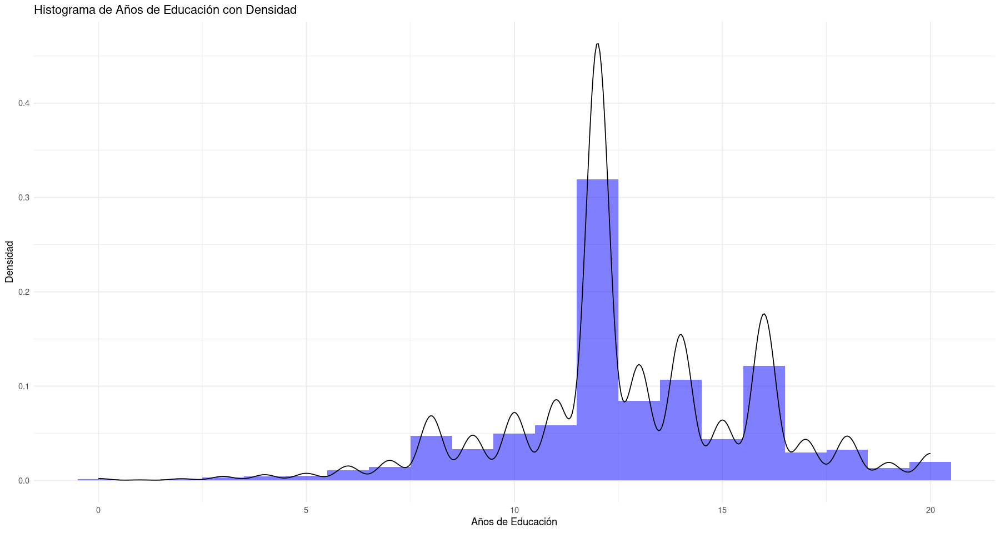

In [29]:
# Escribe aquí la solución
ggplot(vocab, aes(x = education, y = ..density..)) +
    geom_histogram(binwidth = 1, fill = "blue", alpha = 0.5) +
    geom_density()+
    theme_minimal() +
    labs(title = "Histograma de Años de Educación con Densidad",
         x = "Años de Educación",
         y = "Densidad")

**Comentario**

El gráfico que podemos ver aquí es similar al que aparece al principio de la sección, aunque con el binwidth adecuado. Difieren en que en este gráfico se puede observar la función de densidad de probabilidad para la variable en lugar de la frecuencia de aparición de cada una de las edades en el DataFrame.


### Ejercicio 12: Volvamos al histograma original (con el *bindwidth* adecuado). Modifica el código para obtener dos histogramas coloreados por sexo (utiliza el atributo 'fill').  ¿Existe algún problema perceptual en el gráfico?



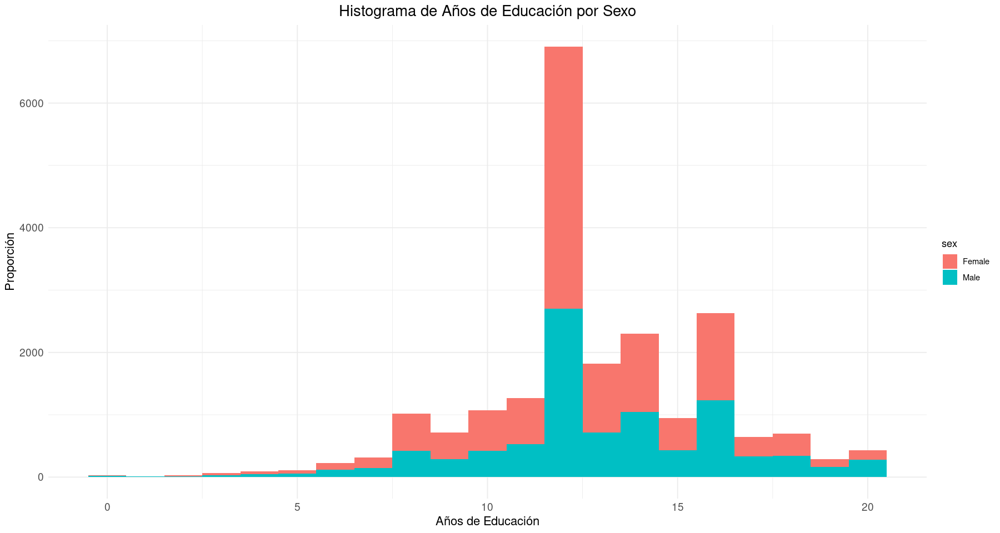

In [30]:
# Intenta resolver el ejercicio antes de seguir leyendo
# Escribe aquí la solución
# Histograma diferenciado por sexo
ggplot(vocab, aes(x = education, fill = sex)) +
    geom_histogram(binwidth = 1) +  # Cambiar 'position' para explorar diferentes visualizaciones
    theme_minimal() +
    labs(title = "Histograma de Años de Educación por Sexo",
         x = "Años de Educación",
         y = "Proporción")+ 
    theme(plot.title = element_text(size = rel(1.5), hjust = 0.5),
        axis.title.x = element_text(size = rel(1.2)), # Ajusta el tamaño de la etiqueta del eje x
        axis.title.y = element_text(size = rel(1.2)), # Ajusta el tamaño de la etiqueta del eje y)
        axis.text.x = element_text(size = rel(1.3)),  # Aumenta el tamaño del texto del eje X
        axis.text.y = element_text(size = rel(1.3))   # Aumenta el tamaño del texto del eje Y
         )


Sí que existe un problema perceptual en el gráfico anterior: ¡no está claro si las barras están apiladas o no! Evidentemente, deberíamos evitar cualquier ambigüedad en nuestros gráficos. Por defecto los gráficos están apilados, aunque no es obvio. Afortunadamente, existen modificadores de posición para los gráficos de barra (recuerda el modificador **jitter** de geom_point). **Prueba las distintas opciones para *position* y usa la más adecuada para representar los dos histogramas**. Las posibles opciones son 'identity', 'jitter', 'dodge', 'stack' y 'fill'.

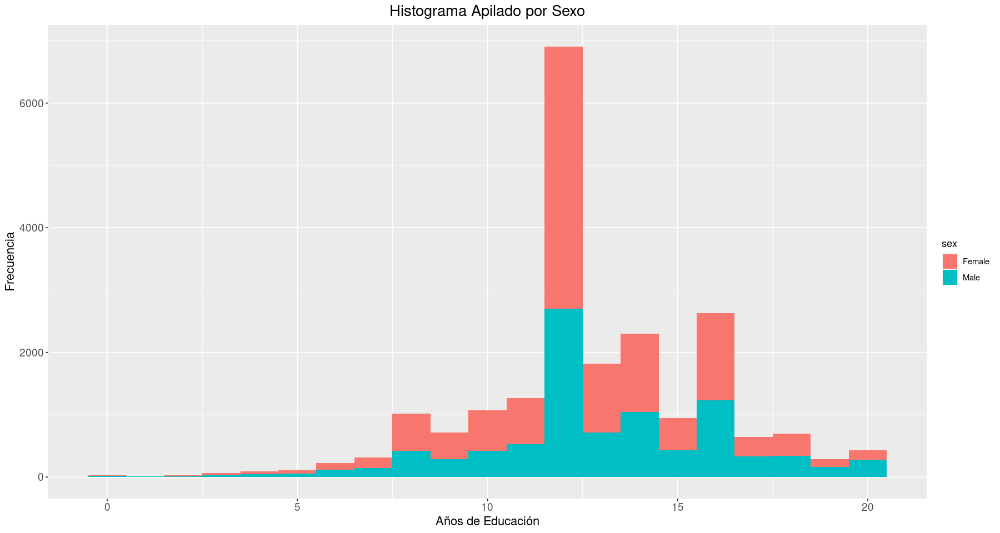

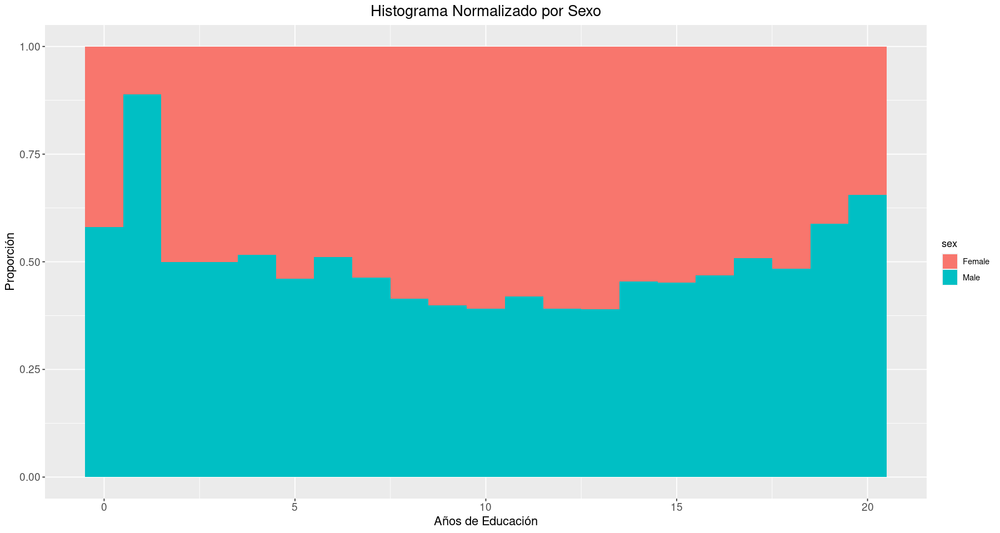

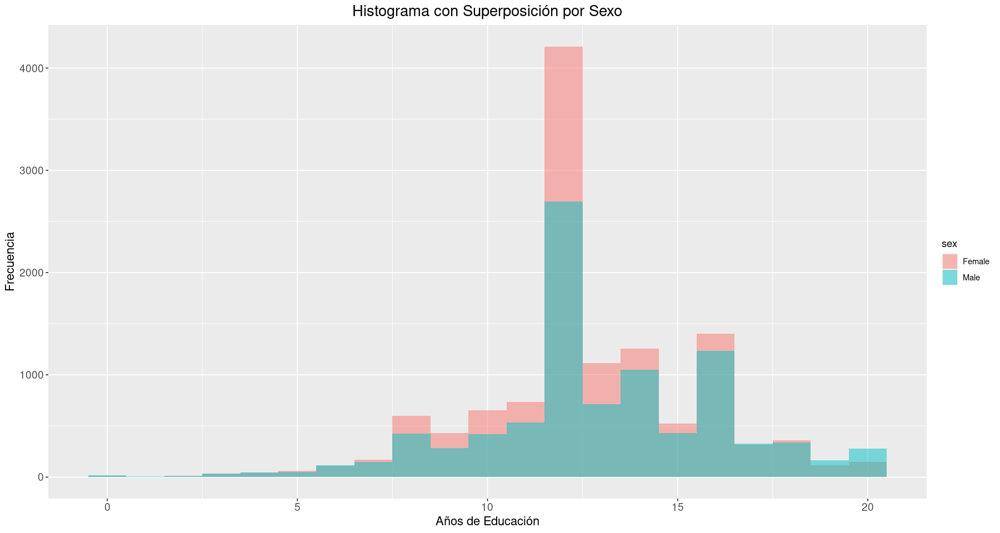

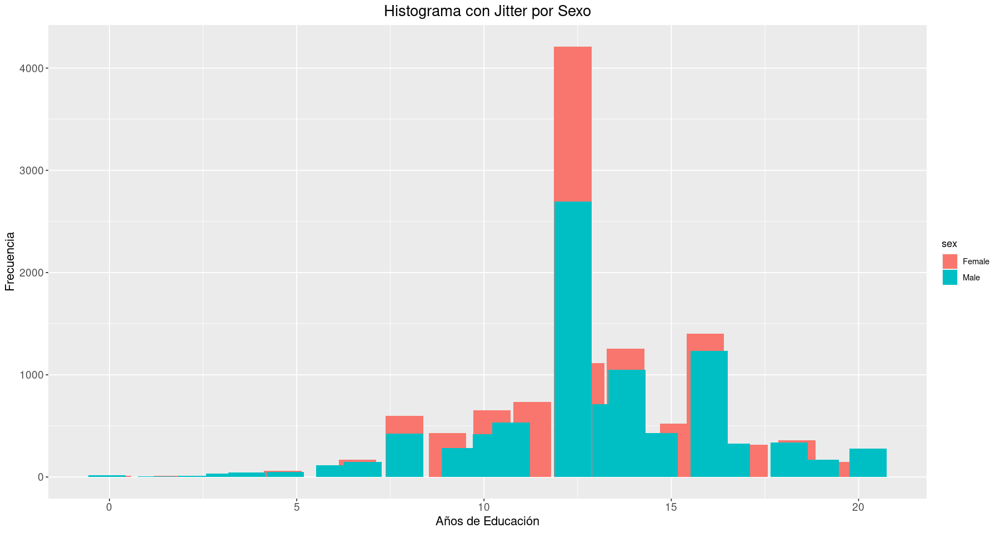

In [31]:
# Escribe aquí la solución

ggplot(vocab, aes(x = education, fill = sex)) +
    geom_histogram(binwidth = 1, position = "stack") +
    labs(title = "Histograma Apilado por Sexo", x = "Años de Educación", y = "Frecuencia")+ 
    theme(plot.title = element_text(size = rel(1.5), hjust = 0.5),
        axis.title.x = element_text(size = rel(1.2)), # Ajusta el tamaño de la etiqueta del eje x
        axis.title.y = element_text(size = rel(1.2)), # Ajusta el tamaño de la etiqueta del eje y)
        axis.text.x = element_text(size = rel(1.3)),  # Aumenta el tamaño del texto del eje X
        axis.text.y = element_text(size = rel(1.3))   # Aumenta el tamaño del texto del eje Y
         )

ggplot(vocab, aes(x = education, fill = sex)) +
    geom_histogram(binwidth = 1, position = "fill") +
    labs(title = "Histograma Normalizado por Sexo", x = "Años de Educación", y = "Proporción")+ 
    theme(plot.title = element_text(size = rel(1.5), hjust = 0.5),
        axis.title.x = element_text(size = rel(1.2)), # Ajusta el tamaño de la etiqueta del eje x
        axis.title.y = element_text(size = rel(1.2)), # Ajusta el tamaño de la etiqueta del eje y)
        axis.text.x = element_text(size = rel(1.3)),  # Aumenta el tamaño del texto del eje X
        axis.text.y = element_text(size = rel(1.3))   # Aumenta el tamaño del texto del eje Y
         )

ggplot(vocab, aes(x = education, fill = sex)) +
    geom_histogram(binwidth = 1, position = "identity", alpha = 0.5) +
    labs(title = "Histograma con Superposición por Sexo", x = "Años de Educación", y = "Frecuencia")+ 
    theme(plot.title = element_text(size = rel(1.5), hjust = 0.5),
        axis.title.x = element_text(size = rel(1.2)), # Ajusta el tamaño de la etiqueta del eje x
        axis.title.y = element_text(size = rel(1.2)), # Ajusta el tamaño de la etiqueta del eje y)
        axis.text.x = element_text(size = rel(1.3)),  # Aumenta el tamaño del texto del eje X
        axis.text.y = element_text(size = rel(1.3))   # Aumenta el tamaño del texto del eje Y
         )

ggplot(vocab, aes(x = education, fill = sex)) +
    geom_histogram(binwidth = 1, position = "jitter") +
    labs(title = "Histograma con Jitter por Sexo", x = "Años de Educación", y = "Frecuencia")+ 
    theme(plot.title = element_text(size = rel(1.5), hjust = 0.5),
        axis.title.x = element_text(size = rel(1.2)), # Ajusta el tamaño de la etiqueta del eje x
        axis.title.y = element_text(size = rel(1.2)), # Ajusta el tamaño de la etiqueta del eje y)
        axis.text.x = element_text(size = rel(1.3)),  # Aumenta el tamaño del texto del eje X
        axis.text.y = element_text(size = rel(1.3))   # Aumenta el tamaño del texto del eje Y
         )


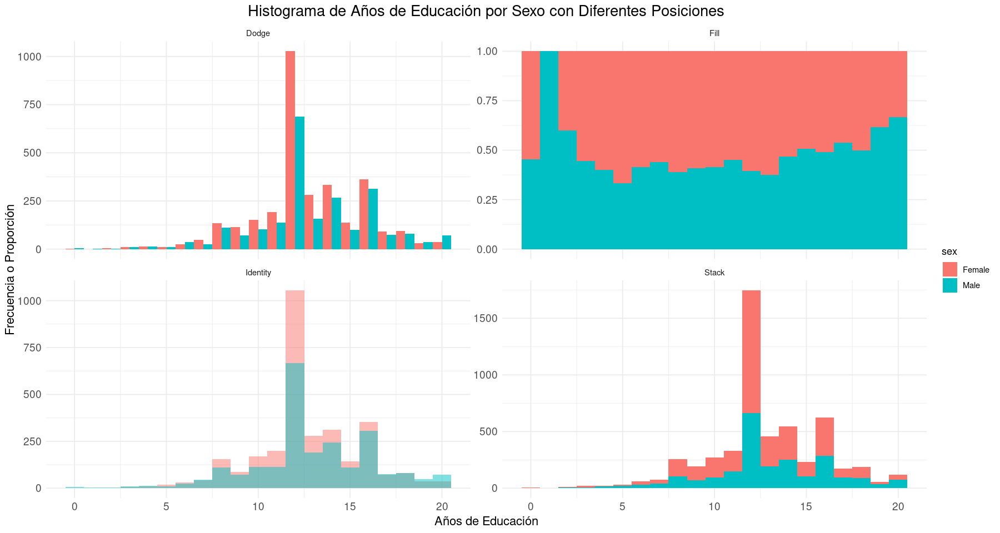

In [32]:
#install.packages("dplyr")
# Asegúrate de que vocab está cargado y que dplyr y ggplot2 están instalados y cargados
library(ggplot2)
library(dplyr)

# Crear un dataframe extendido con una columna para cada tipo de posición
vocab_extended <- vocab %>%
    mutate(
        position_type = rep(c("Stack", "Fill", "Dodge", "Identity"), length.out = nrow(vocab))
    )

# Crear el gráfico
p <- ggplot(vocab_extended, aes(x = education, fill = sex)) + 
    geom_histogram(data = subset(vocab_extended, position_type == "Stack"), binwidth = 1, position = "stack") +
    geom_histogram(data = subset(vocab_extended, position_type == "Fill"), binwidth = 1, position = "fill") +
    geom_histogram(data = subset(vocab_extended, position_type == "Dodge"), binwidth = 1, position = "dodge") +
    geom_histogram(data = subset(vocab_extended, position_type == "Identity"), binwidth = 1, position = "identity", alpha = 0.5) +
    facet_wrap(~position_type, scales = 'free_y') + 
    theme_minimal() +
    labs(title = "Histograma de Años de Educación por Sexo con Diferentes Posiciones", 
         x = "Años de Educación", 
         y = "Frecuencia o Proporción")+
    theme(plot.title = element_text(size = rel(1.5), hjust = 0.5),
        axis.title.x = element_text(size = rel(1.2)), # Ajusta el tamaño de la etiqueta del eje x
        axis.title.y = element_text(size = rel(1.2)), # Ajusta el tamaño de la etiqueta del eje y)
        axis.text.x = element_text(size = rel(1.3)),  # Aumenta el tamaño del texto del eje X
        axis.text.y = element_text(size = rel(1.3))   # Aumenta el tamaño del texto del eje Y
         )
    
# Mostrar el gráfico
print(p)


**Comentario**
Como se mencionó anteriormente, se confirma que en el primer gráfico las barras correspondientes al sexo femenino y masculino se estaban apilando, lo cual podía llevar a interpretaciones erróneas. Esto se debió al uso predeterminado de la opción 'stack' en la visualización.

Para mejorar la claridad, se adoptó la técnica 'dodge' en la representación de histogramas. Esta técnica resulta ser más efectiva para comparar distribuciones de frecuencia por categorías, como es el caso de la diferenciación por sexo en relación con la edad. Al aplicar 'dodge', las barras que representan a cada sexo se colocan una al lado de la otra dentro de cada grupo etario, lo que facilita una comparación más directa y visualmente intuitiva.

Mientras que otras opciones como 'fill' y 'identity' también son posibles, 'fill' tiende a normalizar los datos, lo que puede llevar a la pérdida de detalles importantes sobre las frecuencias absolutas. Por otro lado, 'identity' conserva esta información, pero puede resultar menos intuitiva para comparaciones rápidas y claras. La elección de 'dodge' se basa en su capacidad para mantener un equilibrio entre la claridad visual y la preservación del detalle de los datos, lo cual es especialmente beneficioso si se considera añadir más categorías en análisis futuros.

El análisis del gráfico ajustado con la técnica 'dodge' revela tendencias notables. En la mayoría de los grupos de edad, las barras correspondientes al sexo femenino son más altas que las del sexo masculino, destacándose una diferencia significativa en el grupo de 12 años. Esta disparidad se va atenuando progresivamente con el aumento de la edad, y en los grupos de mayor edad, las frecuencias del sexo masculino tienden a ser superiores. Esta forma de visualización nos permite identificar y comprender de manera eficiente los patrones y diferencias de género a lo largo de los diferentes rangos de edad.

# Facets

Imaginemos que queremos separar un conjunto de datos por una o varias variables nominales (las *facets*) y representar los subconjuntos resultantes en gráficos adyacentes. Para realizar este tipo de gráficos **ggplot** ofrece las funciones *facet_grid* y *facet_wrap*. La función *facet_wrap* acepta como argumento el nombre de la variable por la cuál queremos separar el dataset, mientras que *facet_grid* permite especificar 2 variables. En este notebook nos centraremos en *facet_wrap*.

Anteriormente hemos representado el precio de los diamantes frente al número de Quilates, distinguiendo mediante el color distintos tipos de corte. Podemos realizar una gráfica del precio Vs Quilates separando por el tipo de corte. En este caso, como solo tenemos una variable, emplearemos la función *facet_wrap* (¡Fíjate en la virgulilla que precede a *cut*! Esta es una forma estándar en R de especificar que una variable depende de la variable *cut*):


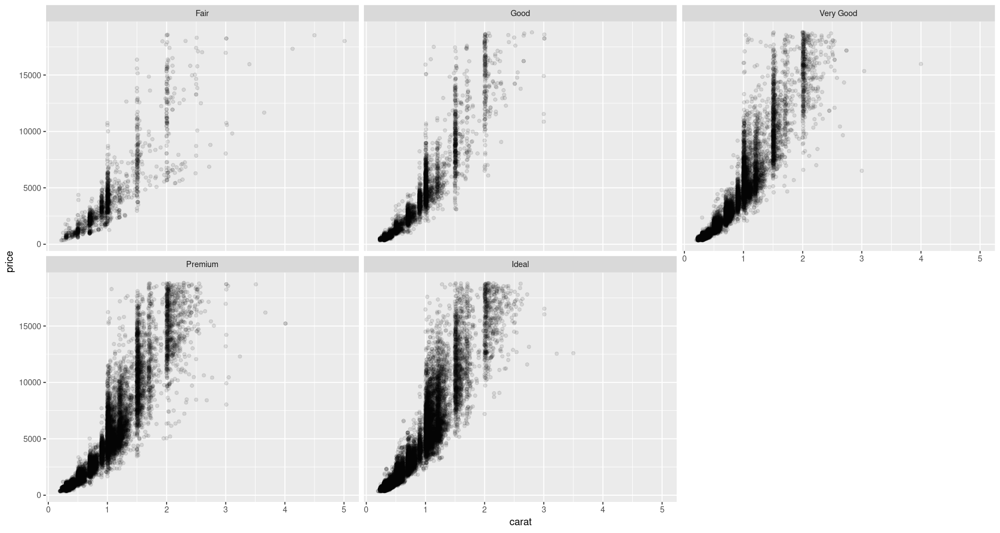

In [33]:
ggplot(diamonds, aes(x=carat,y=price)) + geom_point(alpha=0.1) + facet_wrap(~cut)

### Ejercicio 13: Usando el dataset meat, representa el consumo de carne a lo largo del tiempo, separando el dataset original por tipo de carne (Piensa qué formato debes emplear, *long* o *wide*). Añade a cada sub-gráfico una regresión *loess* sin intervalo de confianza.

`geom_smooth()` using formula = 'y ~ x'
Warning message:
“Removed 1068 rows containing non-finite values (`stat_smooth()`).”


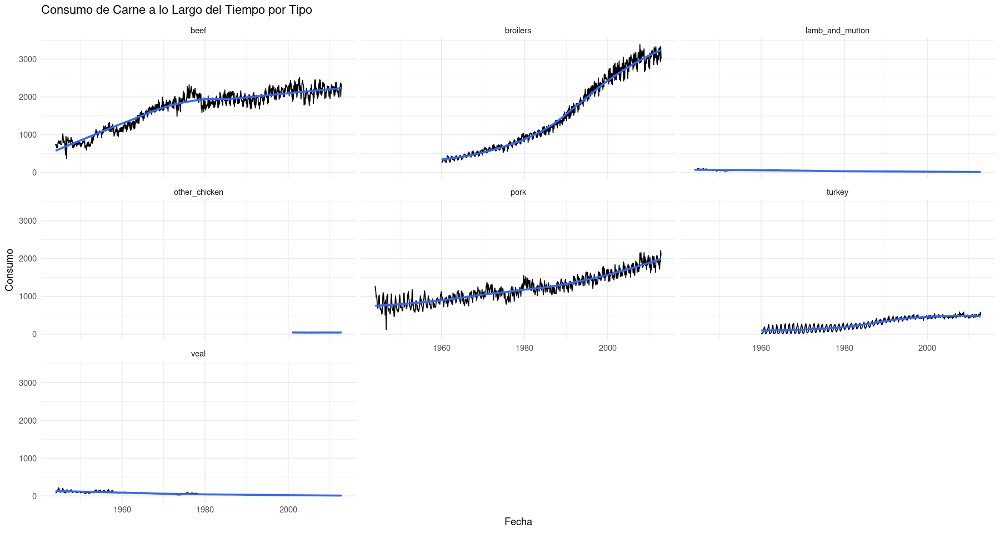

In [34]:
# Escribe aquí la solución
# Asumiendo que meat es tu dataframe y ya está cargado

# Transformar los datos a formato largo
meat_long <- pivot_longer(meat, cols = -date, names_to = "meat_type", values_to = "consumption")

# Crear gráficos separados por tipo de carne con regresión loess
ggplot(meat_long, aes(x = date, y = consumption)) +
    geom_line() +  # Representa el consumo a lo largo del tiempo
    geom_smooth(method = "loess", se = FALSE) +  # Añade regresión loess sin intervalo de confianza
    facet_wrap(~meat_type) +  # Separa los gráficos por tipo de carne
    theme_minimal() +
    labs(
        title = "Consumo de Carne a lo Largo del Tiempo por Tipo",
        x = "Fecha",
        y = "Consumo"
    )


#### Por defecto, *facet_wrap* usa la misma escala para los ejes x e y. **Mejora el gráfico anterior usando el parámetro *scales* **. El parámetro scales acepta los valores 'free_x', 'free_y' y 'free'. ¿Qué efecto tiene cada uno de ellos? 

`geom_smooth()` using formula = 'y ~ x'
Warning message:
“Removed 1068 rows containing non-finite values (`stat_smooth()`).”


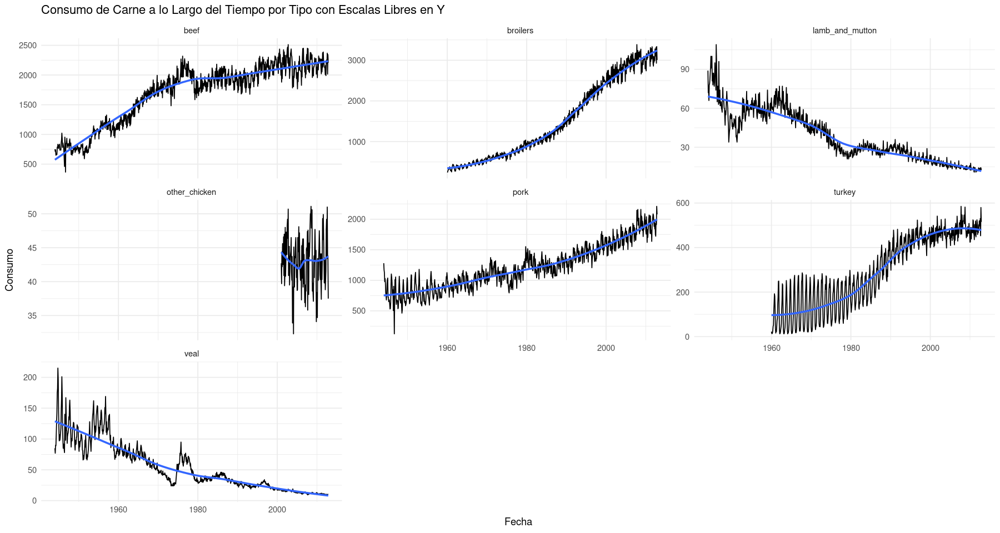

In [35]:
# Escribe aquí la solución

# Crear gráficos con escalas libres en el eje Y
ggplot(meat_long, aes(x = date, y = consumption)) +
    geom_line() +
    geom_smooth(method = "loess", se = FALSE) +
    facet_wrap(~meat_type, scales = 'free_y') +  # Escalas libres en el eje Y
    theme_minimal() +
    labs(
        title = "Consumo de Carne a lo Largo del Tiempo por Tipo con Escalas Libres en Y",
        x = "Fecha",
        y = "Consumo"
    )

- 'free_x': Permite que cada sub-gráfico tenga su propia escala en el eje X, mientras mantiene una escala común en el eje Y.

- 'free_y': Permite que cada sub-gráfico tenga su propia escala en el eje Y, mientras mantiene una escala común en el eje X.

- 'free': Permite que cada sub-gráfico tenga su propia escala tanto en el eje X como en el eje Y. Esto es particularmente útil cuando los rangos de datos en los sub-gráficos varían significativamente.

# Estadísticos

**ggplot** incorpora también una capa estadística con la que es sencillo añadir representaciones de los estadísticos más comunes a nuestros gráficos. Nosotros ya hemos usado esta capa de forma implícita cuando usamos geometrías que implican cálculos estadísticos, como *geom_histogram*, *geom_smooth* o *geom_density*. Estas geometrías hacen uso de las funciones estadísticas *stat_histogram*, *stat_smooth* y *stat_density*, respectivamente (todas las funciones de la capa estadística comienzan por *stat_*. De hecho, estas dos llamadas serían idénticas: 

`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'


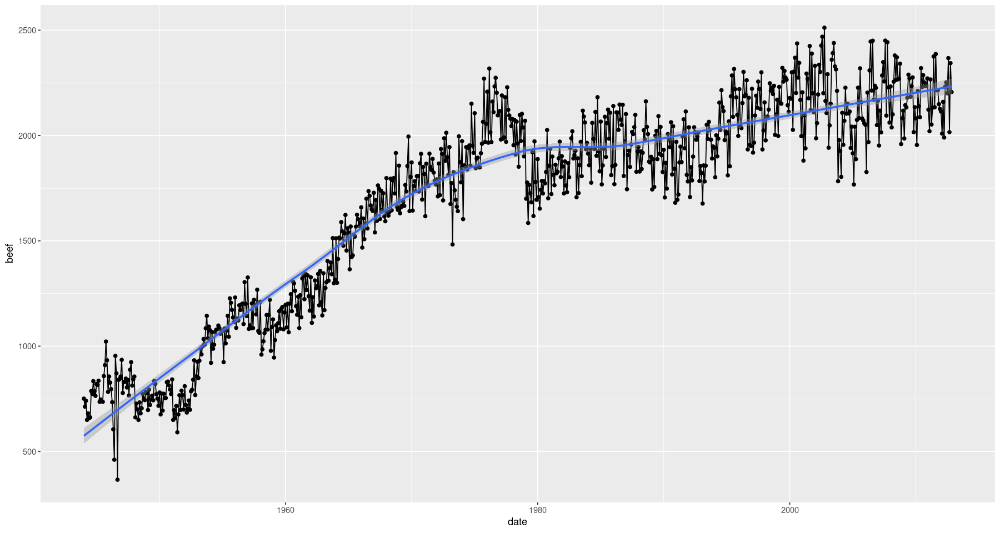

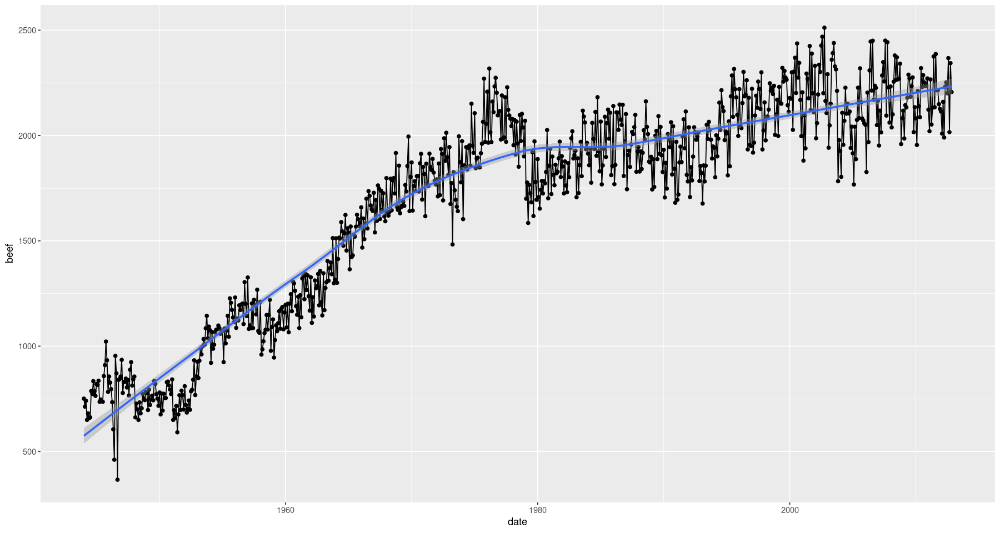

In [36]:
p = ggplot(meat, aes(x=date, y = beef)) + geom_line() + geom_point()
p + stat_smooth()
p + geom_smooth()

### Ejercicio 14: El estadístico *geom_density* permite hacer una (estimación de densidad mediante kernels)[https://en.wikipedia.org/wiki/Kernel_density_estimation]. Añade al histograma normalizado del ejercicio 11 una estimación de la función de densidad. Modifica el atributo *adjust* para controlar la suavidad de la estimación. Repite esto mismo separando el dataset (usando *facets*) mediante la variable *sex*. ¿Son las distribuciones similares?:

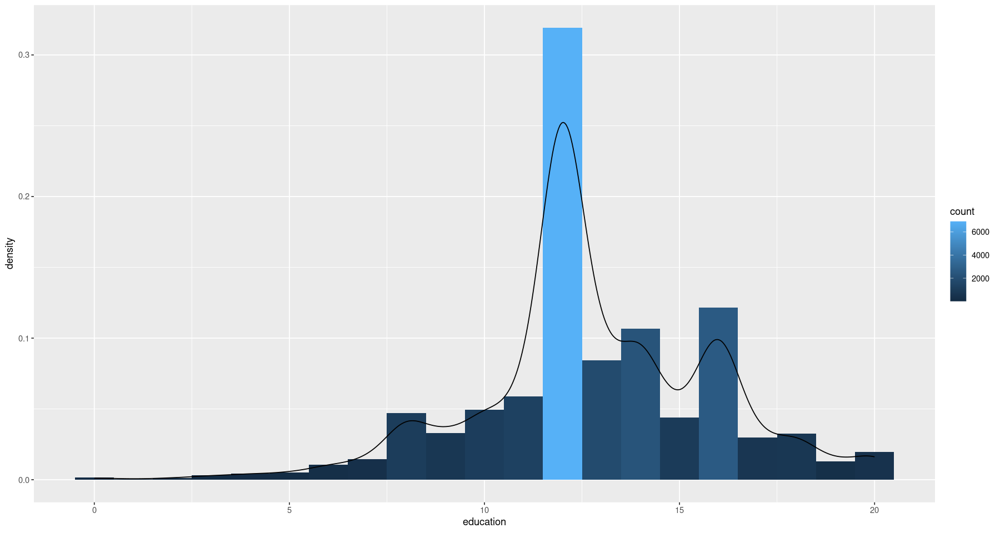

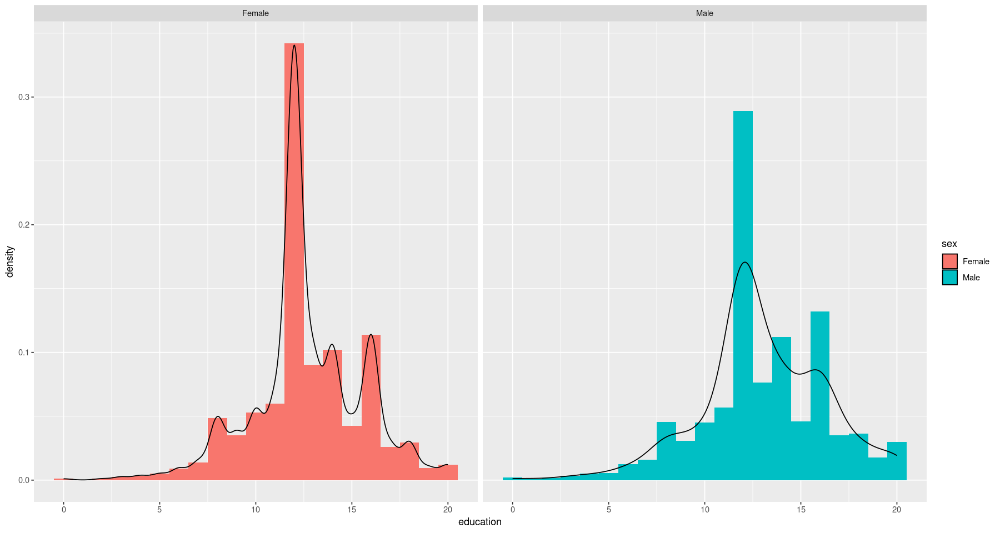

In [37]:
#### Escribe aquí la solución

# Histograma normalizado con estimación de densidad
ggplot(vocab, aes(x = education, y = ..density..)) + 
    geom_histogram(binwidth = 1, aes(fill = ..count..)) +  # Usar 'fill' para colorear según el conteo
    geom_density(adjust = 2, color = "black")  # Estimación de densidad con suavidad ajustada

# Histograma con separación por sexo
ggplot(vocab, aes(x = education, y = ..density.., fill = sex)) + 
    geom_histogram(binwidth = 1) +  # Usar 'fill' para diferenciar por sexo
    facet_wrap(~sex) +  # Separar por sexo
    geom_density(adjust = 2, alpha = 0, color = "black")  # Estimación de densidad sin relleno


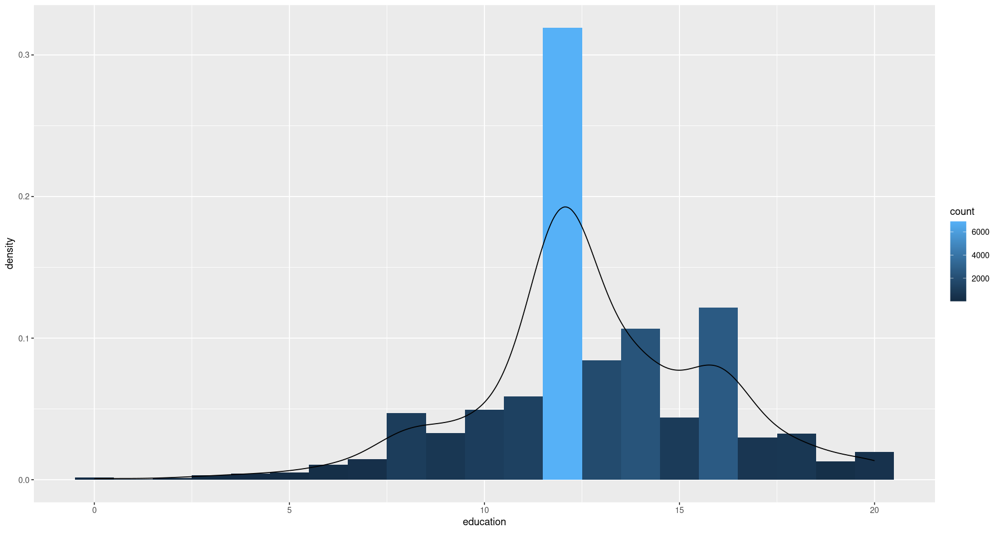

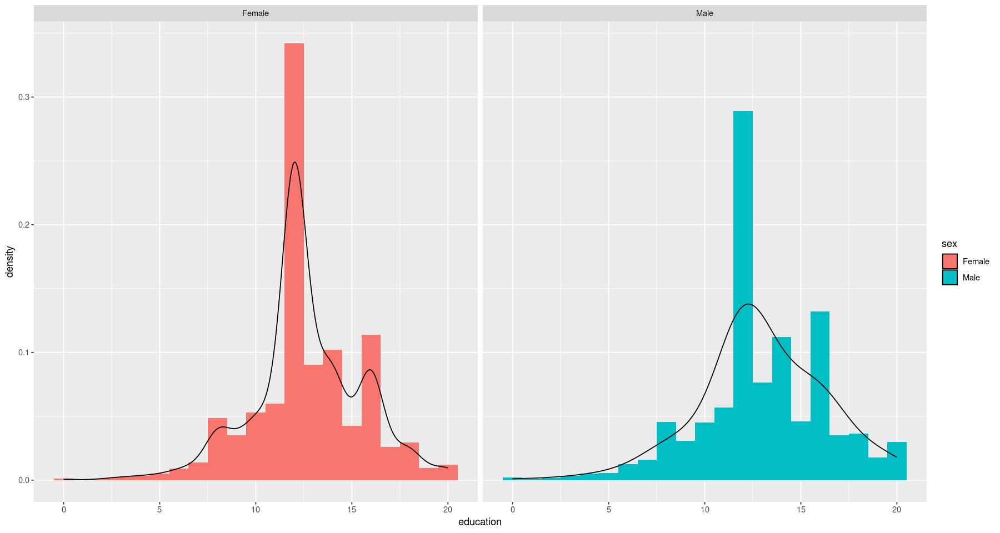

In [38]:

# Histograma normalizado con estimación de densidad
ggplot(vocab, aes(x = education, y = ..density..)) + 
    geom_histogram(binwidth = 1, aes(fill = ..count..)) +  # Usar 'fill' para colorear según el conteo
    geom_density(adjust = 3, color = "black")  # Estimación de densidad con suavidad ajustada

# Histograma con separación por sexo
ggplot(vocab, aes(x = education, y = ..density.., fill = sex)) + 
    geom_histogram(binwidth = 1) +  # Usar 'fill' para diferenciar por sexo
    facet_wrap(~sex) +  # Separar por sexo
    geom_density(adjust = 3, alpha = 0, color = "black")  # Estimación de densidad sin relleno


**Comentario**

Cuánto mayor sea el valor para el atributo adjust más se suaviza la curva de la función de densidad de probabilidad mostrada.

En el panel "Female", la curva de densidad tiene picos más pronunciados y las barras del histograma muestran una distribución más irregular con múltiples modas. En contraste, el panel "Male" muestra una curva de densidad más suave y un histograma con barras que parecen tener una sola moda más clara y menos variabilidad en comparación con el panel "Female".

La diferencia en la suavidad de las curvas de densidad y la distribución de las barras sugiere que las distribuciones de la variable education para los sexos no son idénticas. Parece que la distribución para el sexo femenino es más variada con varios picos indicando posibles grupos de edad o niveles de educación, mientras que para el sexo masculino, la distribución parece ser más concentrada alrededor de un nivel de educación particular.

Además de estadísticos directamente asociados con geometrías también existen otros funciones que nos permiten hacer un resumen estadístico de nuestros datos. Para realizar un resumen de nuestros datos emplearemos la función *stat_summary*. Esta función recibe como argumento una función (*fun.data*) con la que calcula los resumenes estadísticos de los datos.
**ggplot** nos ofrece dos funciones muy útiles para eso:

*mean_cl_normal* calcula la media y un intervalo de confianza para la misma bajo la asunción de normalidad. 
*mean_cl_boot* también calcula un intervalo de confianza para la media, pero hace uso de [*bootstraping*](https://en.wikipedia.org/wiki/Bootstrapping_%28statistics%29) para obtener el intervalo sin necesidad de asumir normalidad. 

Para este apartado generaremos unos datos aleatorios con alguna distribución estadística concreta con los que así comprobar los resultados. Por ejemplo, generaremos datos siguiendo dos distribuciones normales y agrupados en dos grupos distintos(que llamaremos 1 y 2). El siguiente código simula los datos:

In [39]:
npoints = 25
# Simulate data from a normal distribution
data1 = rnorm(npoints, mean=3, sd=1)
data2 = rnorm(npoints, mean=5, 1.5)
labels = factor(rep(c(1,2),each=npoints))
data = data.frame(value=c(data1, data2), label=labels)
head(data)

,value,label
,<dbl>,<fct>
1,2.178599,1
2,3.067697,1
3,3.333302,1
4,3.344766,1
5,2.344311,1
6,2.555220,1


Dado que los datos siguen una distribución normal, para crear un gráfico con los datos y un intervalo de confianza para la media podemos proceder:


Attaching package: ‘Hmisc’


The following objects are masked from ‘package:dplyr’:

    src, summarize


The following objects are masked from ‘package:base’:

    format.pval, units




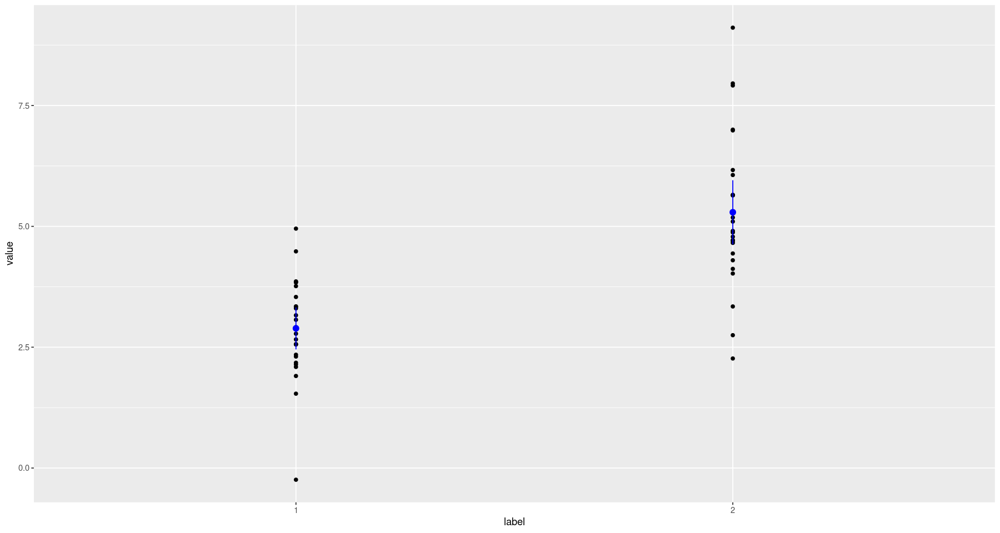

In [40]:
#install.packages("Hmisc")
# Es necesario el paquete Hmisc para el cálculo de los estadísticos
library('Hmisc')
ggplot(data,aes(x=label,y=value)) + geom_point() + stat_summary(fun.data = mean_cl_normal,col='blue')

**Comentario**

Observamos que en el grupo '1', las observaciones se concentran estrechamente alrededor de la media, lo que se refleja en un intervalo de confianza más reducido. Esto sugiere una homogeneidad mayor dentro del grupo y una variabilidad menor entre las medidas. La media, indicada por el diamante azul, se sitúa aproximadamente en 4, con un intervalo de confianza compacto que refuerza la precisión de esta estimación.

En contraste, el grupo '2' exhibe una dispersión más amplia de observaciones, con una tendencia a la asimetría que se evidencia por la acumulación de puntos por debajo de la media. La media de este grupo se encuentra alrededor de 5, y su intervalo de confianza es visiblemente más amplio, lo que indica una mayor incertidumbre en la estimación de la media y una variabilidad superior entre las observaciones. Esta dispersión sugiere una diversidad en los datos que podría ser objeto de un análisis más profundo para entender las causas subyacentes.

Es importante notar que, si bien algunos puntos caen fuera del intervalo de confianza, no es apropiado etiquetarlos directamente como outliers sin un análisis adicional. Los outliers se definen mejor a través de métodos estadísticos específicos más allá de la mera distancia de los intervalos de confianza. Por lo tanto, una interpretación más precisa requeriría un examen estadístico para determinar si estos puntos son efectivamente anomalías o parte de la variabilidad natural de los datos.

Observa que, además de los estadísticos, también hemos dibujado a los propios datos en el gráfico. En general, esto es una buena práctica ya que si sólo pintamos los estadísticos resumen estamos perdiendo mucha información acerca de los datos (¿son simétricos en torno a la media?, ¿hay *outliers*?. Es de destacar que el intervalo de confianza se ha representado mediante una nueva geometría: *geom_pointrange*, que requiere como atributos estéticos *y*, *ymin* e *ymax*. Esto es importante porque, como veremos luego, podemos implementar nuestras propias funciones de resumen con la única condición de que devuelvan estas entradas.


### Ejercicio 15: Mejora el gráfico anterior añadiendo *jitter* y cambiando el  tamaño (incrementándolo ligeramente) y color de los estadísticos (algún otro que se distinga mejor). En esta ocasión, usa *geom_jitter* (en lugar de *geom_point(position='jitter')* y modifica el nivel del ruido en los ejes x e y mediante los parámetros *width* y *height*.


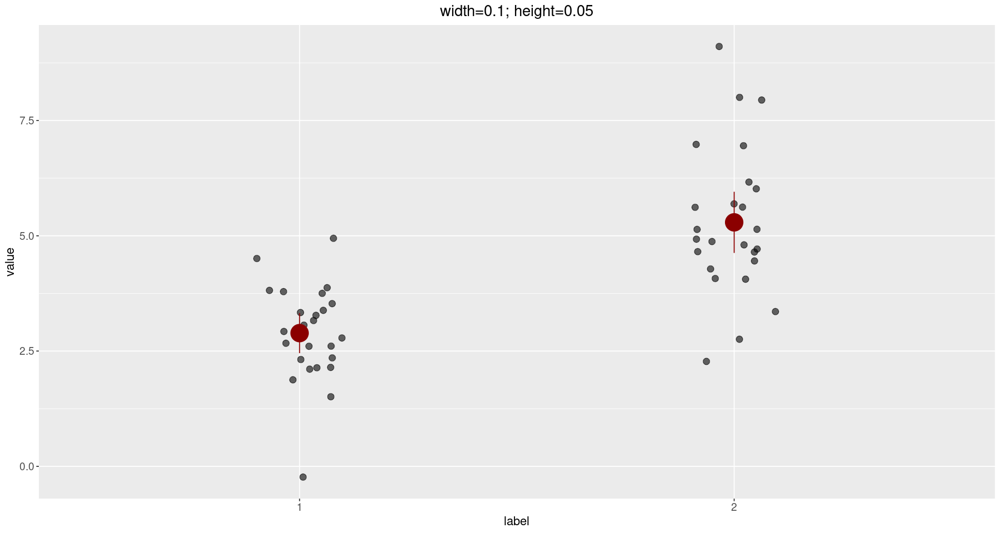

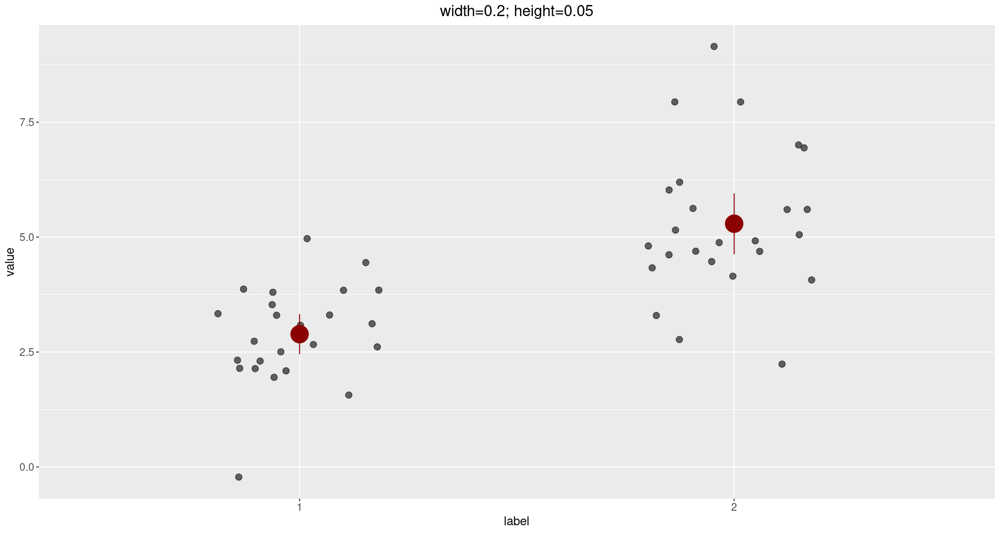

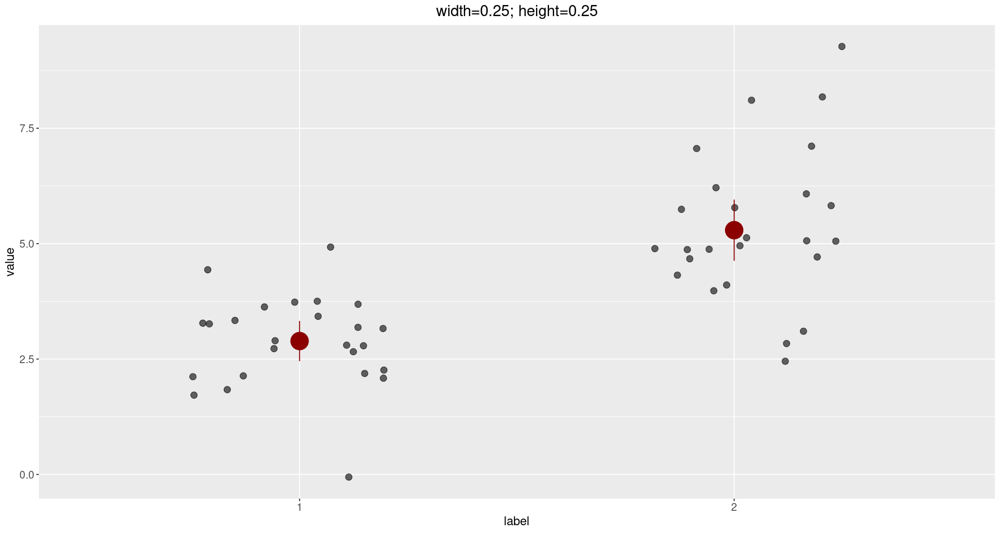

In [41]:
# Escribe aquí la solución. usa el data.frame data

titulo_conf <-  theme(plot.title = element_text(size = rel(1.5), hjust = 0.5),
        axis.title.x = element_text(size = rel(1.2)), # Ajusta el tamaño de la etiqueta del eje x
        axis.title.y = element_text(size = rel(1.2)), # Ajusta el tamaño de la etiqueta del eje y)
        axis.text.x = element_text(size = rel(1.3)),  # Aumenta el tamaño del texto del eje X
        axis.text.y = element_text(size = rel(1.3))   # Aumenta el tamaño del texto del eje Y
         )

# Asumiendo que 'data' es tu dataframe y ya está cargado
# Mejora el gráfico añadiendo jitter y cambiando el aspecto de los estadísticos
ggplot(data, aes(x = label, y = value)) + 
    geom_jitter(width = 0.1, height = 0.05, size = 3, alpha = 0.6) +  # Añade jitter para separar los puntos
    stat_summary(fun.data = mean_cl_normal, colour = "darkred", size = 2) +  # Cambia color y tamaño de los estadísticos
    labs(title='width=0.1; height=0.05') + titulo_conf

ggplot(data, aes(x = label, y = value)) + 
    geom_jitter(width = 0.2, height = 0.05, size = 3, alpha = 0.6) +  # Añade jitter para separar los puntos
    stat_summary(fun.data = mean_cl_normal, colour = "darkred", size = 2) +  # Cambia color y tamaño de los estadísticos
    labs(title='width=0.2; height=0.05') + titulo_conf

ggplot(data, aes(x = label, y = value)) + 
    geom_jitter(width = 0.25, height = 0.25, size = 3, alpha = 0.6) +  # Añade jitter para separar los puntos
    stat_summary(fun.data = mean_cl_normal, colour = "darkred", size = 2) +  # Cambia color y tamaño de los estadísticos
    labs(title='width=0.25; height=0.25') + titulo_conf


**Comentario**

En geom_jitter:

    width: Controla el nivel de "ruido" o la cantidad de dispersión horizontal de los puntos para evitar la superposición.
    height: Controla la dispersión vertical de los puntos, aunque normalmente se deja en un valor bajo para no alterar la representación de la variable value.
    size: Aumenta el tamaño de los puntos para mejorar la visibilidad.
    alpha: Controla la transparencia de los puntos para poder ver mejor las superposiciones.

En stat_summary:

    colour: Se ha cambiado a "darkred" para mejorar el contraste y la visibilidad de los estadísticos.
    size: Incrementa el tamaño de los elementos estadísticos para destacarlos más en el gráfico.




### Ejercicio 16: Usando los datos aleatorios generados abajo obtén un resumen usando *mean_cl_boot*. 

In [42]:
npoints = 20
# simulation
# Datos no  normales!!
data1 = rchisq(npoints, df=2) 
data2 = rchisq(npoints, df=1) 
labels = factor(rep(c(1,2),each=npoints))
data = data.frame(value=c(data1, data2), label=labels)
head(data)

,value,label
,<dbl>,<fct>
1,2.2396141,1
2,4.1486692,1
3,0.9922538,1
4,0.4373744,1
5,0.3274985,1
6,4.9697683,1


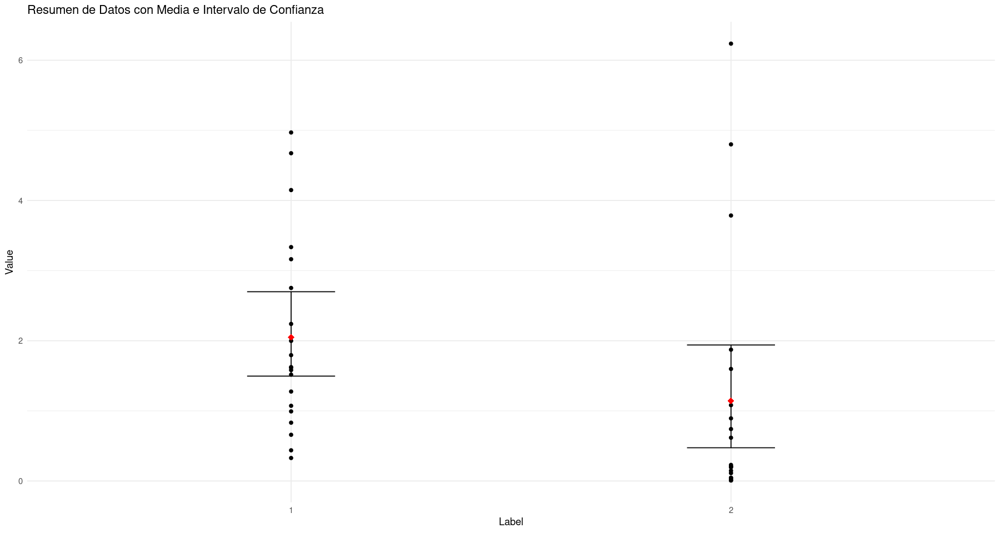

In [43]:
# Escribe aquí la solución 
# Crear el gráfico
ggplot(data, aes(x = label, y = value)) +
    geom_point() +  # Mostrar los puntos individuales
    stat_summary(fun.data = mean_cl_boot, geom = "errorbar", width = 0.2) +  # Mostrar la media con intervalo de confianza
    stat_summary(fun = mean, geom = "point", shape = 18, size = 3, color = "red") +  # Mostrar la media como un punto
    theme_minimal() +
    labs(
        title = "Resumen de Datos con Media e Intervalo de Confianza",
        x = "Label",
        y = "Value"
    )

**Comentario**

Para el grupo '1', la media se sitúa en un valor más bajo en el eje 'y', y el intervalo de confianza es más largo, lo cual indica una mayor incertidumbre en la estimación de la media. Para el grupo '2', la media es más alta, y el intervalo de confianza es más corto, sugiriendo una mayor precisión en la estimación de la media para este grupo. Además, el grupo '2' parece tener una menor variabilidad en las observaciones, ya que los puntos están más agrupados alrededor de la media y hay menos puntos alejados de ella.

Como hemos mencionado antes podemos crear nuestras propias funciones de resumen con la única condición de que reciban como argumento un vector y devuelvan un *data.frame* con las entradas *y*, *ymin* e *ymax*. En el siguiente ejemplo, se implementa una función sin mucha utilidad estadística que devuelve el mínimo, la mediana y el máximo de una serie de datos:

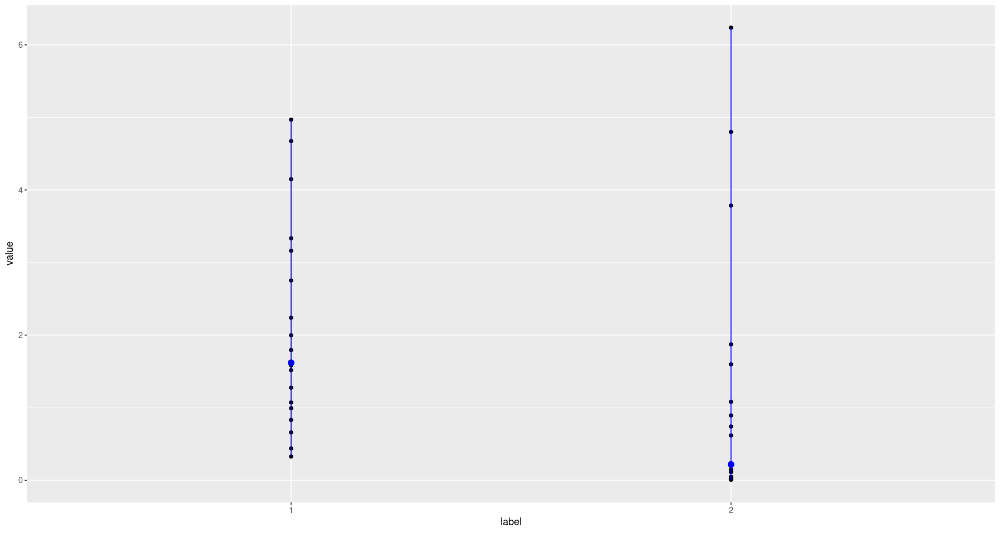

In [44]:
# Esta función no es muy útil
useless = function (series)
    data.frame('y' = median(series),'ymin'= min(series), 'ymax' = max(series))

ggplot(data,aes(x=label,y=value)) + geom_point() + stat_summary(fun.data = useless, color="blue")

### Ejercicio 17: Implementa una función que devuelva como estadísticos la mediana y los percentiles 0.10 y 0.90 (usa la función *quantile* de R). Utiliza esta función en combinación con *stat_summary* sobre los datos sintéticos anteriores. Recuerda mejorar el plot anterior añadiendo *jitter*. 

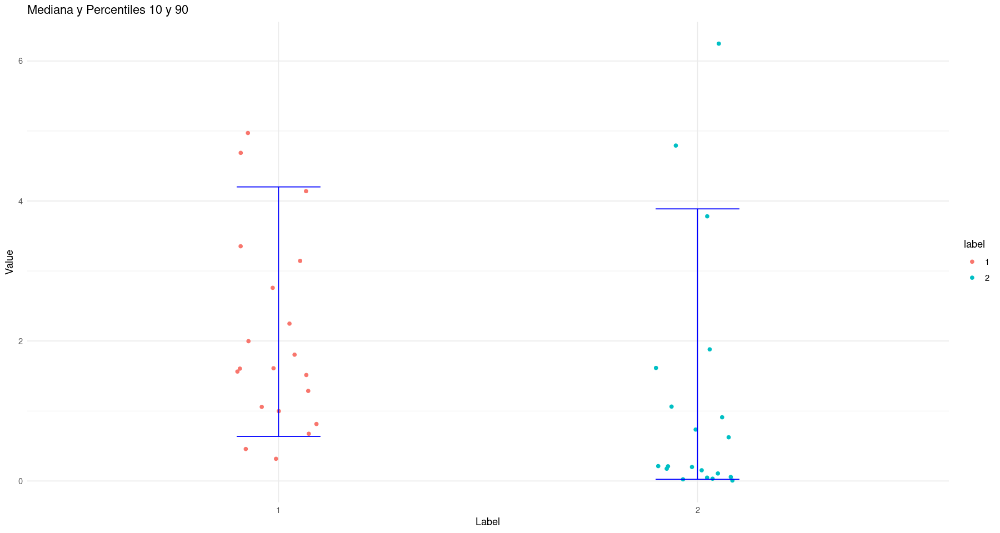

In [45]:
# Esta función no es muy útil... Complétala para que lo sea
useful = function (series)
    data.frame('y' = median(series), 'ymin'= quantile(series, probs=c(0.1)), 'ymax' = quantile(series, probs=c(0.9)))

# Introduce aquí el comando ggplot
library(ggplot2)


ggplot(data, aes(x = label, y = value)) +
    geom_jitter(width = 0.1, height = 0.02, aes(color = label)) +  # Añadir jitter
    stat_summary(fun.data = useful, geom = "errorbar", width = 0.2, color = "blue") +  # Mostrar mediana y percentiles
    theme_minimal() +
    labs(
        title = "Mediana y Percentiles 10 y 90",
        x = "Label",
        y = "Value"
    )


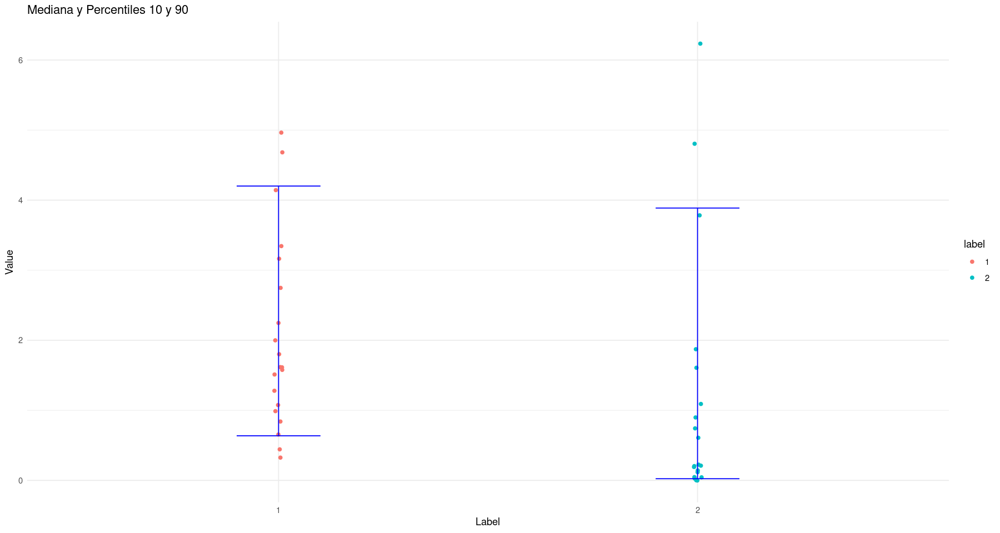

In [46]:
# Introduce aquí el comando ggplot
ggplot(data, aes(x = label, y = value)) +
    geom_jitter(width = 0.01, height = 0.01, aes(color = label)) +  # Añadir jitter
    stat_summary(fun.data = useful, geom = "errorbar", width = 0.2, color = "blue") +  # Mostrar mediana y percentiles
    theme_minimal() +
    labs(
        title = "Mediana y Percentiles 10 y 90",
        x = "Label",
        y = "Value"
    )


# Boxplots y violin-plots
Aunque nos hemos entretenido usando las funciones resumen, podríamos haber conseguido un efecto similar mediante los clásicos boxplots (*geom_boxplot*) o los [violin plots](https://en.wikipedia.org/wiki/Violin_plot) (*geom_violin*).

### Ejercicio 18: Usando los datos del ejercicio anterior, crea un boxplot y un violin-plot. Añade por encima de ellos los propios puntos con *jitter*. 
Normalmente los boxplots suelen pintar outliers. Para evitar pintarlos dos veces (una mediante *boxplot* y otro mediante *geom_jitter*), usa *outliers.shape=NA* dentro de geom_boxplot.

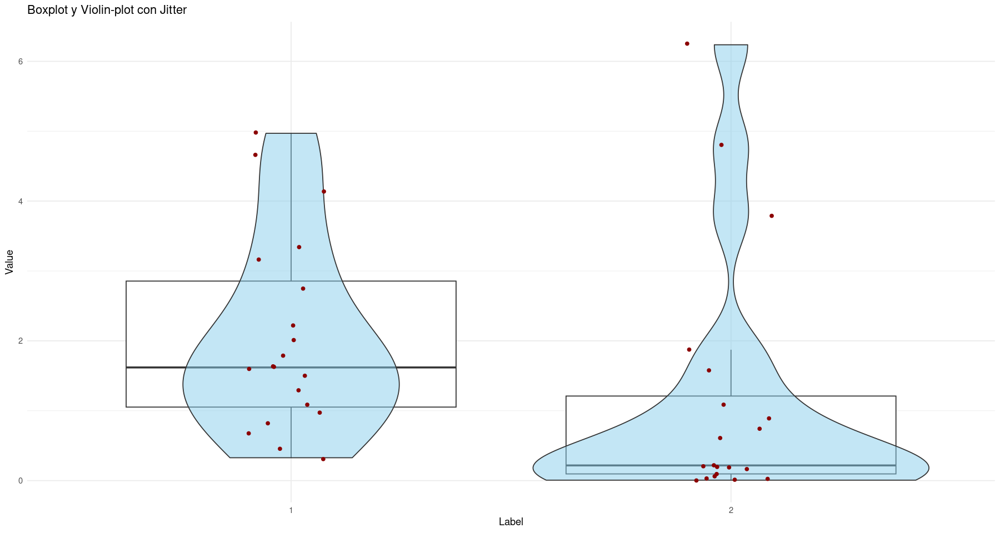

In [47]:
# Escribe aquí la solución
library(ggplot2)

# Suponiendo que data es el dataframe de los datos sintéticos anteriores
ggplot(data, aes(x = label, y = value)) +
    # Boxplot sin outliers
    geom_boxplot(outlier.shape = NA) +
    # Violin plot
    geom_violin(fill = "skyblue", alpha = 0.5) +
    # Añadir puntos con jitter
    geom_jitter(width = 0.1, height = 0.02, color = "darkred", size = 1.5) +
    theme_minimal() +
    labs(
        title = "Boxplot y Violin-plot con Jitter",
        x = "Label",
        y = "Value"
    )


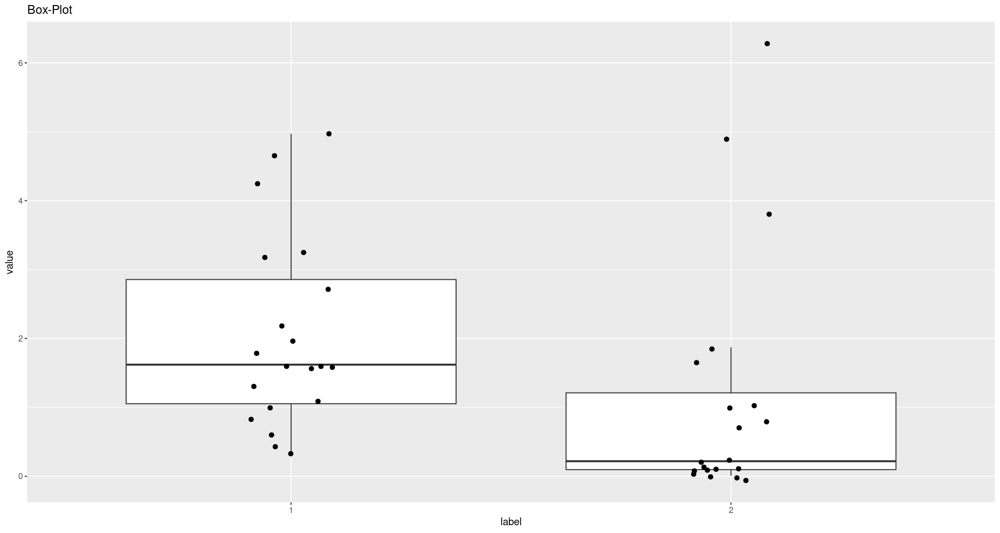

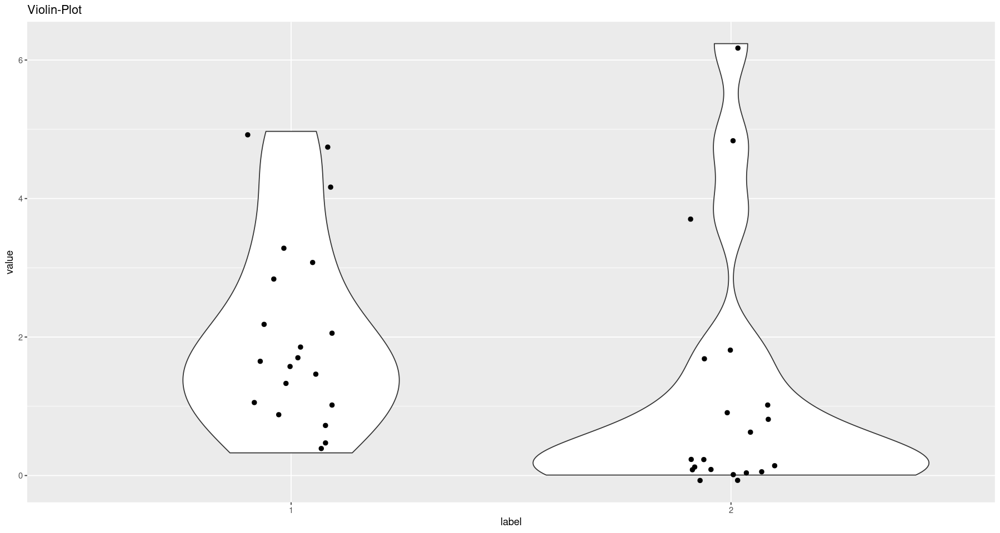

In [48]:


# Escribe aquí la solución
ggplot(data, aes(x=label,y=value)) + 
    geom_boxplot(outlier.shape=NA) + 
    geom_jitter(width=0.1, height=0.1, size=2) + 
    labs(title='Box-Plot')

ggplot(data, aes(x=label,y=value)) + 
    geom_violin() + 
    geom_jitter(width=0.1, height=0.1, size=2) + 
    labs(title='Violin-Plot')

     


# Anotaciones y temas

Finalmente, veremos como podemos dar un título a nuestros gráficos y como podemos modificar el aspecto estético final de nuestros gráficos. Mediante los llamados **temas**, **ggplot** permite  al usuario controlar cualquier elemento del gráfico no relacionado directamente con los datos. De hecho, es posible crear y editar cualquier tema para personalizar nuestros gráficos. Para modificar el tema aplicado a un gráfico emplearemos la función *theme_xxx()* siendo *xxx* el nombre del tema. Fíjate como este diseño sigue la filosofía de construir gráficas mediante la combinación de distintas capas.

### Ejercicio 19: Guarda el *scatterplot* de *Vocabulary* Vs *education* (nuestra versión con *jitter* ) en una variable y luego aplícale distintos temas. Puedes ver los temas disponibles explorando en: http://ggplot2.tidyverse.org/reference/ggtheme.html.


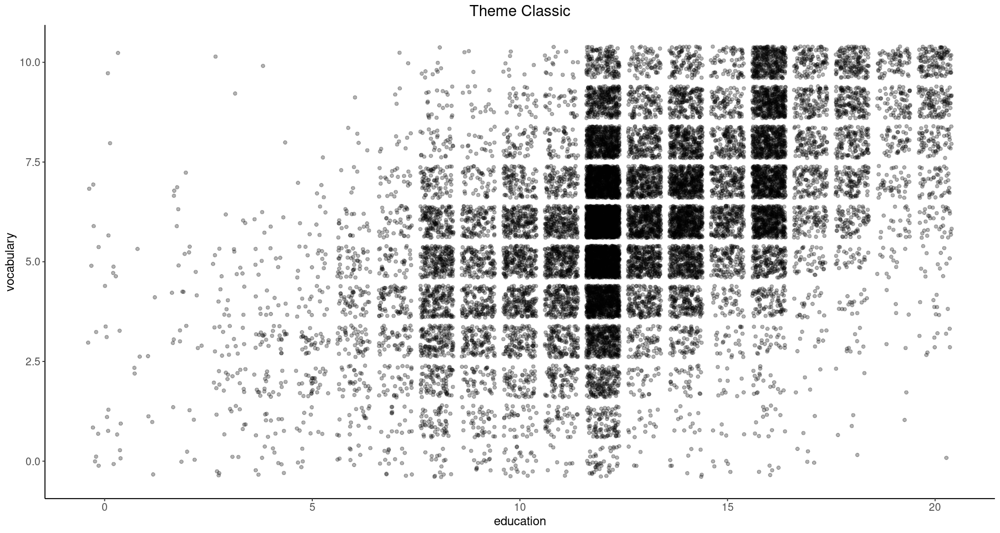

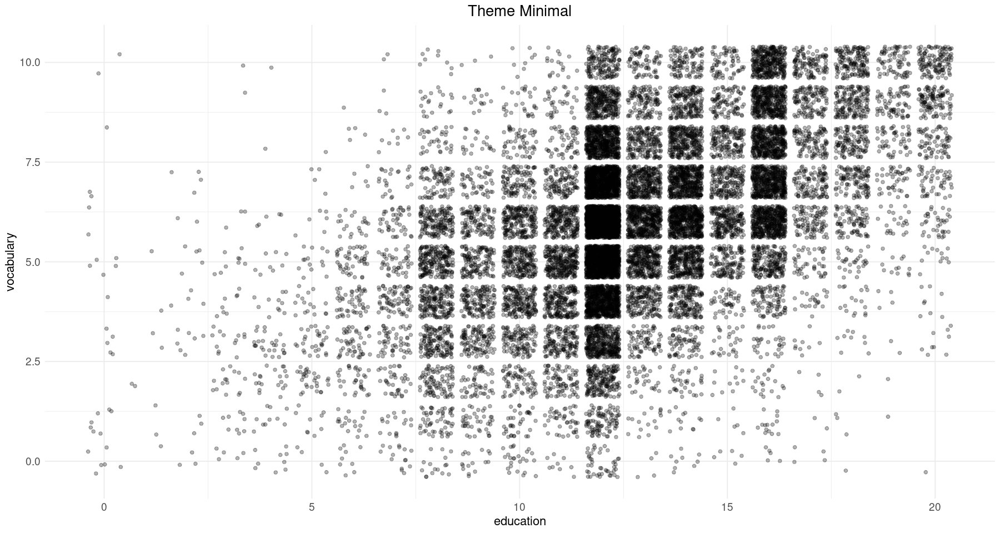

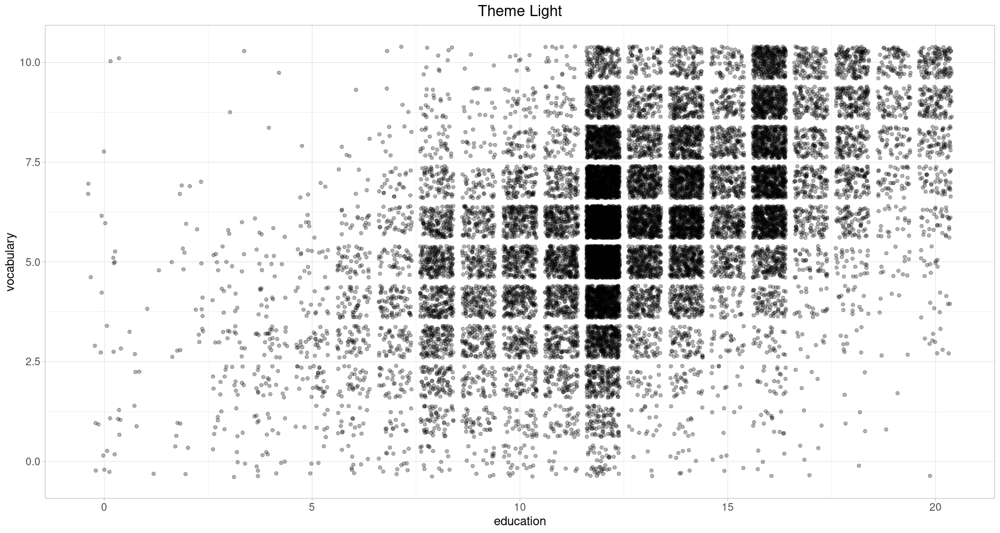

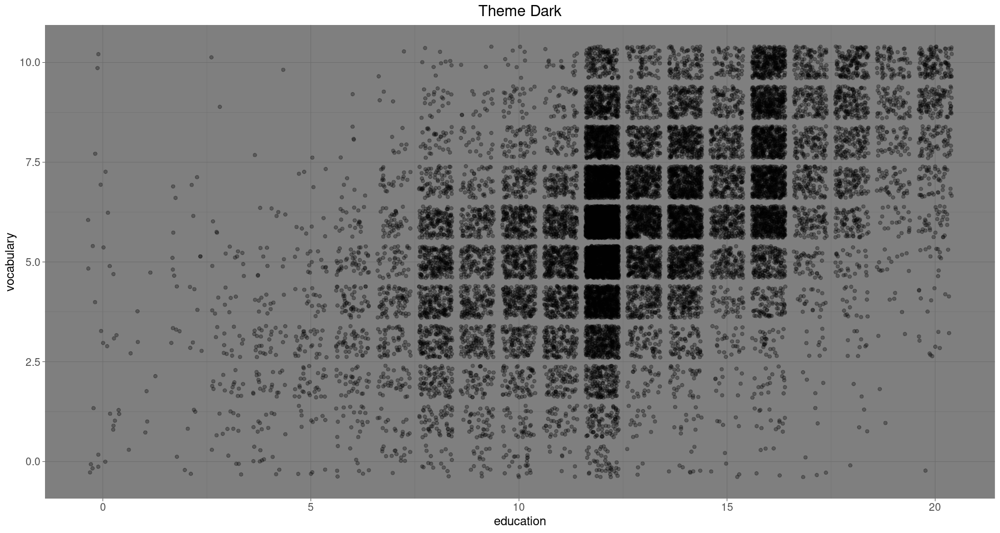

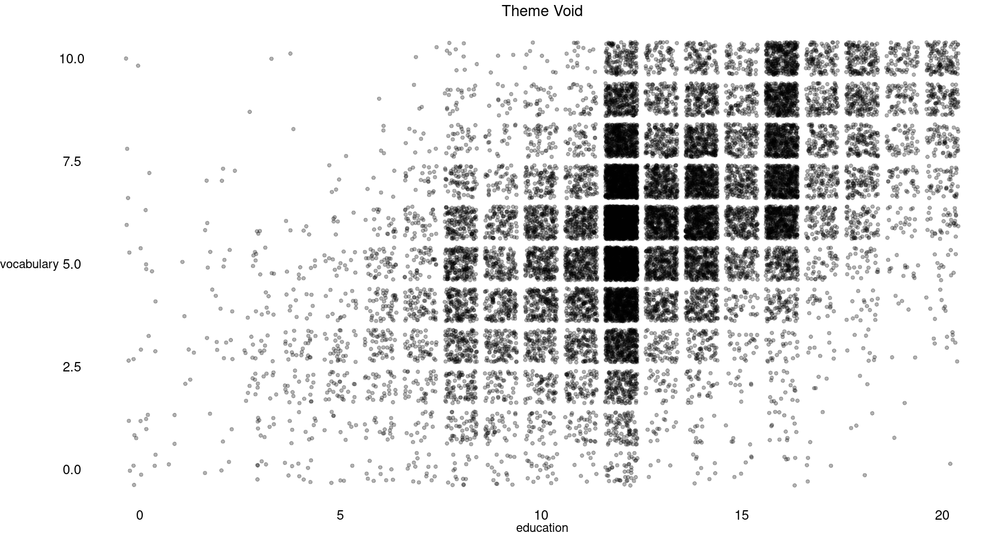

In [49]:
# Escribe aquí la solución

# Crear el scatterplot con jitter
vocab_vs_education_graf <-  ggplot(vocab, aes(x=education, y=vocabulary)) + 
                        geom_point(position='jitter', alpha=0.3)

# Aplicar diferentes temas
# Tema clásico
vocab_vs_education_graf + theme_classic() + labs(title='Theme Classic') +titulo_conf 


# Tema minimalista
vocab_vs_education_graf + theme_minimal() + labs(title='Theme Minimal') +titulo_conf


# Tema ligero
vocab_vs_education_graf + theme_light() + labs(title='Theme Light')+ titulo_conf

# Tema oscuro
vocab_vs_education_graf + theme_dark() + labs(title='Theme Dark')+titulo_conf


# Tema vacío (sin eje ni nada)
vocab_vs_education_graf + theme_void() + labs(title='Theme Void')+titulo_conf



Finalmente, aunque **ggplot** incluye automáticamente un nombre para los ejes x e y puede ser necesario modificarlos para aclararlos o indicar las unidades de medida (¡¡Importantísimo!!). También suele ser una buena idea incluir un título que aclare qué es lo que se está representando.

![Los gráficos siempre con títulos](http://imgs.xkcd.com/comics/convincing.png)

#### Ejercicio 20: Utiliza las funciones *xlab()*, *ylab()* y *ggtitle()* para modificar los nombres de los ejes y el título de nuestro gráfico anterior.

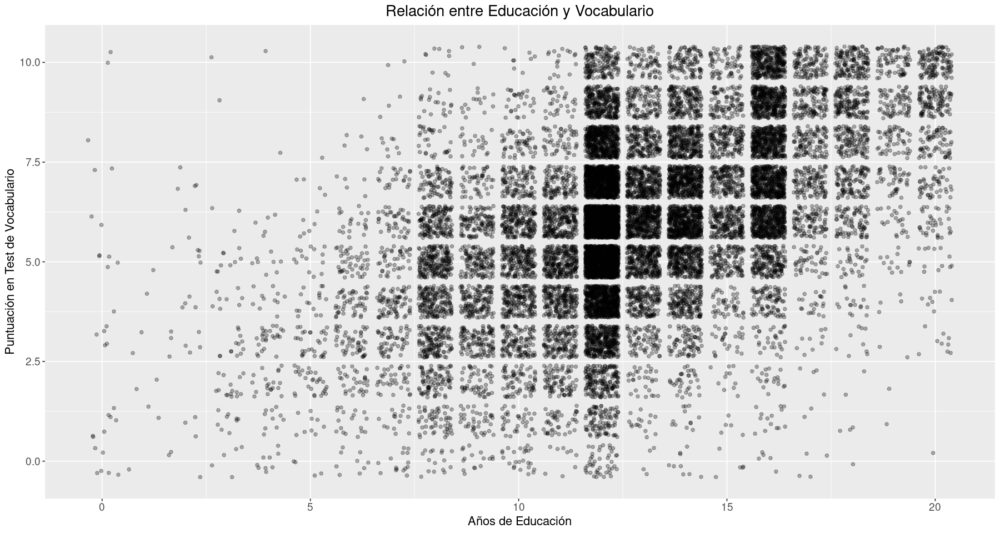

In [52]:
# Escribe aquí la solución
# Modificar títulos de ejes y título general
vocab_vs_education_graf_title <- vocab_vs_education_graf +
    xlab("Años de Educación") +  # Cambiar nombre del eje X
    ylab("Puntuación en Test de Vocabulario") +  # Cambiar nombre del eje Y
    ggtitle("Relación entre Educación y Vocabulario")+  # Cambiar el título del gráfico
    titulo_conf
# Mostrar el gráfico modificado
print(vocab_vs_education_graf_title)

## Apéndice: R y ggplot2 en Jupyter
En una terminal de R (evita hacerlo en una consola proporcionada por cualquier IDE), instala los siguientes paquetes:

`> install.packages(c('repr', 'IRdisplay', 'evaluate', 'crayon', 'pbdZMQ', 'devtools', 'uuid', 'digest'))`
`> devtools::install_github('IRkernel/IRkernel')`

Registra el kernel de R en Jupyter:

`> IRkernel::installspec()`

Finalmente, instala los paquetes necesarios para la práctica:

`> install.packages(c('ggplot2', 'Hmisc'))` 


Si trabajas con anaconda también puedes crear un nuevo *environment* para trabajar con R:

`$ conda create -n my-r-env -c r r-essentials`

Una vez creado el nuevo *environment*, recuerda instalar el paquete *Hmisc* mediante:

`$ conda install -c r r-hmisc`